In [1]:
import pandas as pd
import os
import collections, functools, operator
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline # in sequence
from sklearn.compose import make_column_transformer # in parallel
from sklearn.preprocessing import PolynomialFeatures, OneHotEncoder, StandardScaler # deal with nonlinear and categorical data
from sklearn.metrics import r2_score
from sklearn.tree import DecisionTreeRegressor, plot_tree, export_text
import matplotlib.pyplot as plt
import datetime

In [2]:
print(os.getcwd())

C:\Users\Collin\Documents\Python Projects\Atlantic Hurricane Seasons 2.0


In [3]:
os.listdir()

['.ipynb_checkpoints',
 'amo_updated.txt',
 'cleaned_july_rainfall.csv',
 'hurdat2.csv',
 'meiv2.txt',
 'nhc.noaa.gov_data_hurdat_hurdat2-1851-2022-050423.txt',
 'psl.noaa.gov_data_correlation_amon.us.long.data.txt',
 'upo.es_vareclim_Data_ASWI.txt',
 'work_file.ipynb']

In [4]:
# attempting to clean the NHC's hurdat2 dataset on the path/strength/size of recorded historic Atlantic tropical cyclones

In [5]:
txt_data = pd.read_csv("nhc.noaa.gov_data_hurdat_hurdat2-1851-2022-050423.txt")

In [6]:
csv_data = txt_data.to_csv("hurdat2.csv", index = None)

In [7]:
print(csv_data)

None


In [8]:
print(txt_data)

                                                                                                                  AL011851  \
18510625  0000     HU  28.0N   94.8W 80.0 -999.0  -999.0 -999.0 -999.0 -999.0 -999.0 -999.0 -999.0 -999.0 -999.0    -999.0   
          0600     HU  28.0N   95.4W 80.0 -999.0  -999.0 -999.0 -999.0 -999.0 -999.0 -999.0 -999.0 -999.0 -999.0    -999.0   
          1200     HU  28.0N   96.0W 80.0 -999.0  -999.0 -999.0 -999.0 -999.0 -999.0 -999.0 -999.0 -999.0 -999.0    -999.0   
          1800     HU  28.1N   96.5W 80.0 -999.0  -999.0 -999.0 -999.0 -999.0 -999.0 -999.0 -999.0 -999.0 -999.0    -999.0   
          2100  L  HU  28.2N   96.8W 80.0 -999.0  -999.0 -999.0 -999.0 -999.0 -999.0 -999.0 -999.0 -999.0 -999.0    -999.0   
...                                                                                                                    ...   
20221110  1900  L  TS  29.2N   83.0W 40.0  989.0   200.0  60.0   100.0  130.0  0.0    0.0    0.0    0.0    0.0        

In [9]:
for line in open("nhc.noaa.gov_data_hurdat_hurdat2-1851-2022-050423.txt"):
    row = line.split(",")
    print(row)   

['AL011851', '            UNNAMED', '     14', '\n']
['18510625', ' 0000', '  ', ' HU', ' 28.0N', '  94.8W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18510625', ' 0600', '  ', ' HU', ' 28.0N', '  95.4W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18510625', ' 1200', '  ', ' HU', ' 28.0N', '  96.0W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18510625', ' 1800', '  ', ' HU', ' 28.1N', '  96.5W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18510625', ' 2100', ' L', ' HU', ' 28.2N', '  96.8W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['18630910', ' 0000', '  ', ' HU', ' 22.6N', '  63.2W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18630910', ' 0600', '  ', ' HU', ' 23.9N', '  63.7W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18630910', ' 1200', '  ', ' HU', ' 25.1N', '  64.0W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18630910', ' 1800', '  ', ' HU', ' 26.4N', '  64.1W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18630911', ' 0000', '  ', ' HU', ' 27.8N', '  64.1W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18630911', ' 0600', '  ', ' HU', ' 29.

['18670729', ' 1800', '  ', ' HU', ' 21.0N', '  65.8W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18670730', ' 0000', '  ', ' HU', ' 21.9N', '  67.1W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18670730', ' 0600', '  ', ' HU', ' 22.7N', '  68.3W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18670730', ' 1200', '  ', ' HU', ' 23.5N', '  69.5W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18670730', ' 1800', '  ', ' HU', ' 24.6N', '  70.9W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18670731', ' 0000', '  ', ' HU', ' 25.

['18690902', ' 0600', '  ', ' TS', ' 31.0N', '  68.0W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18690902', ' 1200', '  ', ' TS', ' 32.0N', '  67.0W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18690902', ' 1800', '  ', ' TS', ' 33.0N', '  66.0W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL051869', '            UNNAMED', '      9', '\n']
['18690904', ' 0000', '  ', ' HU', ' 26.2N', '  88.4W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18690904', ' 0600', '  ', ' HU', ' 26.7N', '  88.6W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['18761018', ' 0000', '  ', ' HU', ' 19.7N', '  81.1W', '  90', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18761018', ' 0600', '  ', ' HU', ' 20.2N', '  81.3W', '  90', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18761018', ' 1200', '  ', ' HU', ' 20.7N', '  81.5W', '  90', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18761018', ' 1800', '  ', ' HU', ' 21.2N', '  81.7W', '  90', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18761019', ' 0000', '  ', ' HU', ' 21.7N', '  81.9W', ' 100', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18761019', ' 0600', '  ', ' HU', ' 22.

['18780702', ' 1200', '  ', ' TS', ' 25.9N', '  82.4W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18780702', ' 1500', ' L', ' TS', ' 26.0N', '  81.8W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18780702', ' 1800', '  ', ' TD', ' 26.3N', '  81.0W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18780703', ' 0000', '  ', ' TS', ' 27.3N', '  79.6W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18780703', ' 0600', '  ', ' TS', ' 28.0N', '  78.3W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18780703', ' 1200', '  ', ' TS', ' 28.

['18781018', ' 1800', '  ', ' HU', ' 31.0N', '  56.8W', ' 100', '  951', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18781019', ' 0000', '  ', ' HU', ' 31.9N', '  57.2W', ' 100', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18781019', ' 0600', '  ', ' HU', ' 32.8N', '  57.4W', ' 100', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18781019', ' 1200', '  ', ' HU', ' 33.5N', '  57.6W', '  90', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18781019', ' 1800', '  ', ' HU', ' 34.5N', '  57.8W', '  90', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL111878', '            UNNAMED', '   

['18840910', ' 1200', '  ', ' TS', ' 30.6N', '  80.6W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18840910', ' 1800', '  ', ' TS', ' 31.0N', '  80.9W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18840911', ' 0000', '  ', ' TS', ' 31.5N', '  81.1W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18840911', ' 0100', ' L', ' TS', ' 31.6N', '  81.2W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18840911', ' 0600', '  ', ' TS', ' 31.9N', '  81.5W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18840911', ' 1200', '  ', ' TD', ' 32.

['18850927', ' 0600', '  ', ' TS', ' 30.2N', '  58.8W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18850927', ' 1200', '  ', ' TS', ' 31.3N', '  59.0W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18850927', ' 1800', '  ', ' TS', ' 32.3N', '  59.3W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18850928', ' 0000', '  ', ' TS', ' 33.2N', '  59.6W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18850928', ' 0600', '  ', ' TS', ' 34.0N', '  59.8W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18850928', ' 1200', '  ', ' TS', ' 35.

['18861009', ' 1800', '  ', ' HU', ' 23.3N', '  85.1W', '  65', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18861010', ' 0000', '  ', ' HU', ' 23.9N', '  85.4W', '  65', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18861010', ' 0600', '  ', ' HU', ' 24.6N', '  85.7W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18861010', ' 1200', '  ', ' HU', ' 25.2N', '  86.0W', '  75', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18861010', ' 1800', '  ', ' HU', ' 25.7N', '  86.4W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18861011', ' 0000', '  ', ' HU', ' 26.

['18900828', ' 0600', '  ', ' HU', ' 21.3N', '  63.3W', ' 105', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18900828', ' 1200', '  ', ' HU', ' 22.0N', '  64.5W', ' 105', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18900828', ' 1800', '  ', ' HU', ' 22.8N', '  65.7W', ' 105', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18900829', ' 0000', '  ', ' HU', ' 23.9N', '  66.9W', ' 100', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18900829', ' 0600', '  ', ' HU', ' 25.0N', '  68.0W', '  95', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18900829', ' 1200', '  ', ' HU', ' 26.

['18910920', ' 0000', '  ', ' HU', ' 28.1N', '  60.0W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18910920', ' 0600', '  ', ' HU', ' 28.8N', '  60.7W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18910920', ' 1200', '  ', ' HU', ' 29.5N', '  61.5W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18910920', ' 1800', '  ', ' HU', ' 30.0N', '  62.1W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18910921', ' 0000', '  ', ' HU', ' 30.5N', '  62.7W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18910921', ' 0600', '  ', ' HU', ' 31.

['18920916', ' 0600', '  ', ' EX', ' 55.1N', '  61.5W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18920916', ' 1200', '  ', ' EX', ' 56.3N', '  58.4W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18920916', ' 1800', '  ', ' EX', ' 57.4N', '  56.0W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18920917', ' 0000', '  ', ' EX', ' 58.4N', '  54.2W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18920917', ' 0600', '  ', ' EX', ' 59.4N', '  52.8W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18920917', ' 1200', '  ', ' EX', ' 60.

['18970831', ' 1800', '  ', ' TS', ' 14.1N', '  26.1W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18970901', ' 0000', '  ', ' TS', ' 14.2N', '  27.3W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18970901', ' 0600', '  ', ' TS', ' 14.3N', '  28.4W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18970901', ' 1200', '  ', ' TS', ' 14.5N', '  29.5W', '  55', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18970901', ' 1800', '  ', ' HU', ' 14.7N', '  30.6W', '  65', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18970902', ' 0000', '  ', ' HU', ' 15.

['18980914', ' 1200', '  ', ' HU', ' 23.6N', '  64.8W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18980914', ' 1800', '  ', ' HU', ' 23.9N', '  64.9W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18980915', ' 0000', '  ', ' HU', ' 24.3N', '  65.2W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18980915', ' 0600', '  ', ' HU', ' 24.7N', '  65.5W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18980915', ' 1200', '  ', ' HU', ' 25.0N', '  65.8W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18980915', ' 1800', '  ', ' HU', ' 25.

['18981006', ' 1800', '  ', ' TS', ' 16.2N', '  75.2W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18981007', ' 0000', '  ', ' TS', ' 16.3N', '  76.0W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18981007', ' 0600', '  ', ' TS', ' 16.4N', '  76.8W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18981007', ' 1200', '  ', ' TS', ' 16.7N', '  77.7W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18981007', ' 1800', '  ', ' TS', ' 17.0N', '  78.3W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18981008', ' 0000', '  ', ' TS', ' 17.

['19010928', ' 0600', '  ', ' TS', ' 30.6N', '  84.5W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19010928', ' 1200', '  ', ' EX', ' 32.5N', '  84.0W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19010928', ' 1800', '  ', ' EX', ' 35.1N', '  82.7W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19010929', ' 0000', '  ', ' EX', ' 37.8N', '  81.4W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19010929', ' 0600', '  ', ' EX', ' 40.3N', '  80.1W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19010929', ' 1200', '  ', ' EX', ' 42.

['19030814', ' 1800', '  ', ' HU', ' 22.1N', '  93.4W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19030815', ' 0000', '  ', ' HU', ' 22.3N', '  94.3W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19030815', ' 0600', '  ', ' HU', ' 22.6N', '  95.1W', '  70', '  986', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19030815', ' 1200', '  ', ' HU', ' 23.0N', '  96.0W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19030815', ' 1800', '  ', ' HU', ' 23.1N', '  96.8W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19030816', ' 0000', '  ', ' HU', ' 23.

['19031121', ' 1200', '  ', ' HU', ' 29.3N', '  45.4W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19031121', ' 1800', '  ', ' HU', ' 29.5N', '  44.7W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19031122', ' 0000', '  ', ' HU', ' 29.7N', '  44.1W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19031122', ' 0600', '  ', ' HU', ' 30.0N', '  43.6W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19031122', ' 1200', '  ', ' HU', ' 30.4N', '  43.2W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19031122', ' 1800', '  ', ' HU', ' 31.

['19090824', ' 1200', '  ', ' HU', ' 20.6N', '  79.5W', '  75', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19090824', ' 1800', '  ', ' HU', ' 20.7N', '  81.1W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19090825', ' 0000', '  ', ' HU', ' 20.8N', '  82.6W', '  95', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19090825', ' 0600', '  ', ' HU', ' 20.9N', '  84.1W', ' 100', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19090825', ' 1200', '  ', ' HU', ' 21.0N', '  85.5W', ' 100', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19090825', ' 1800', '  ', ' HU', ' 21.

['19100826', ' 1200', '  ', ' TD', ' 27.5N', '  79.0W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19100826', ' 1800', '  ', ' TD', ' 28.4N', '  79.0W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19100827', ' 0000', '  ', ' EX', ' 29.6N', '  79.0W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19100827', ' 0600', '  ', ' EX', ' 30.7N', '  79.0W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19100827', ' 1200', '  ', ' EX', ' 31.7N', '  78.7W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19100827', ' 1800', '  ', ' EX', ' 32.

['19120611', ' 1200', '  ', ' TS', ' 26.5N', '  91.5W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19120611', ' 1800', '  ', ' TS', ' 26.8N', '  91.7W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19120612', ' 0000', '  ', ' TS', ' 27.2N', '  92.0W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19120612', ' 0600', '  ', ' TS', ' 27.6N', '  92.3W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19120612', ' 1200', '  ', ' TS', ' 28.0N', '  92.5W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19120612', ' 1800', '  ', ' TS', ' 28.

['19180801', ' 1800', '  ', ' TS', ' 13.2N', '  63.8W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19180802', ' 0000', '  ', ' TS', ' 13.4N', '  65.5W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19180802', ' 0600', '  ', ' TS', ' 13.7N', '  67.3W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19180802', ' 1200', '  ', ' TS', ' 14.0N', '  69.0W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19180802', ' 1800', '  ', ' TS', ' 14.4N', '  70.8W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19180803', ' 0000', '  ', ' TS', ' 14.

['19190906', ' 1800', '  ', ' TS', ' 22.5N', '  73.1W', '  55', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19190907', ' 0000', '  ', ' TS', ' 22.8N', '  73.5W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19190907', ' 0600', '  ', ' HU', ' 23.0N', '  74.0W', '  65', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19190907', ' 1200', '  ', ' HU', ' 23.2N', '  74.5W', '  75', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19190907', ' 1800', '  ', ' HU', ' 23.4N', '  75.1W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19190908', ' 0000', '  ', ' HU', ' 23.

['19210910', ' 1800', '  ', ' HU', ' 16.9N', '  68.0W', ' 100', '  961', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19210911', ' 0000', '  ', ' HU', ' 17.6N', '  68.3W', ' 110', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19210911', ' 0600', '  ', ' HU', ' 18.3N', '  68.5W', ' 110', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19210911', ' 1200', '  ', ' HU', ' 19.0N', '  68.6W', '  90', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19210911', ' 1800', '  ', ' HU', ' 19.8N', '  68.7W', '  90', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19210912', ' 0000', '  ', ' HU', ' 20.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['19620830', ' 0600', '  ', ' TS', ' 29.3N', '  28.2W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19620830', ' 1200', '  ', ' TS', ' 30.7N', '  28.8W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19620830', ' 1800', '  ', ' TS', ' 32.2N', '  28.1W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19620831', ' 0000', '  ', ' TS', ' 33.8N', '  27.0W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19620831', ' 0600', '  ', ' TS', ' 35.4N', '  25.4W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19620831', ' 1200', '  ', ' TS', ' 37.

['19621007', ' 0600', '  ', ' HU', ' 39.8N', '  65.8W', '  90', '  963', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19621007', ' 1200', '  ', ' EX', ' 42.0N', '  66.4W', '  90', '  950', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19621007', ' 1800', '  ', ' EX', ' 42.7N', '  66.9W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19621008', ' 0000', '  ', ' EX', ' 43.5N', '  66.5W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19621008', ' 0600', '  ', ' EX', ' 44.1N', '  64.8W', '  65', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19621008', ' 1200', '  ', ' EX', ' 44.

['19621126', ' 1200', '  ', ' EX', ' 33.0N', '  73.0W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19621126', ' 1800', '  ', ' EX', ' 33.0N', '  74.5W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19621127', ' 0000', '  ', ' EX', ' 32.7N', '  75.7W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19621127', ' 0600', '  ', ' EX', ' 32.0N', '  76.4W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19621127', ' 1200', '  ', ' EX', ' 31.3N', '  76.6W', '  65', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19621127', ' 1800', '  ', ' EX', ' 30.

['19640611', ' 1800', '  ', ' TS', ' 39.6N', '  56.4W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL021964', '            UNNAMED', '     50', '\n']
['19640728', ' 0600', '  ', ' TS', ' 19.1N', '  46.0W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640728', ' 1200', '  ', ' TS', ' 19.1N', '  48.5W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640728', ' 1800', '  ', ' TS', ' 19.3N', '  50.8W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640729', ' 0000', '  ', ' TS', ' 19.8N', '  52.8W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['19640828', ' 0600', '  ', ' TS', ' 28.6N', '  81.0W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640828', ' 1200', '  ', ' TS', ' 29.5N', '  81.3W', '  55', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640828', ' 1800', '  ', ' TS', ' 30.2N', '  81.3W', '  55', '  995', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640829', ' 0000', '  ', ' TS', ' 30.8N', '  81.3W', '  50', '  999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640829', ' 0400', ' L', ' TS', ' 31.2N', '  81.3W', '  50', '  999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640829', ' 0600', '  ', ' TS', ' 31.

['19640916', ' 0000', '  ', ' EX', ' 44.4N', '  34.8W', '  55', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640916', ' 0600', '  ', ' EX', ' 44.0N', '  31.5W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640916', ' 1200', '  ', ' EX', ' 43.5N', '  29.0W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640916', ' 1800', '  ', ' EX', ' 42.5N', '  27.5W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640917', ' 0000', '  ', ' EX', ' 41.5N', '  26.5W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640917', ' 0600', '  ', ' EX', ' 40.

['19660722', ' 1200', '  ', ' TD', ' 10.0N', '  35.0W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19660722', ' 1800', '  ', ' TD', ' 10.4N', '  36.8W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19660723', ' 0000', '  ', ' TD', ' 10.9N', '  38.7W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19660723', ' 0600', '  ', ' TD', ' 11.5N', '  40.7W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19660723', ' 1200', '  ', ' TD', ' 12.2N', '  42.7W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19660723', ' 1800', '  ', ' TD', ' 13.

['19660905', ' 0600', '  ', ' EX', ' 55.2N', '  29.4W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19660905', ' 1200', '  ', ' EX', ' 57.3N', '  24.5W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19660905', ' 1800', '  ', ' EX', ' 58.7N', '  19.4W', '  75', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19660906', ' 0000', '  ', ' EX', ' 60.2N', '  12.7W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19660906', ' 0600', '  ', ' EX', ' 61.5N', '   7.0W', '  65', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19660906', ' 1200', '  ', ' EX', ' 62.

['19661005', ' 0200', ' L', ' HU', ' 24.6N', '  81.8W', '  85', '  988', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19661005', ' 0600', '  ', ' HU', ' 24.5N', '  82.3W', '  85', '  985', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19661005', ' 1200', '  ', ' HU', ' 24.5N', '  83.0W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19661005', ' 1800', '  ', ' HU', ' 24.3N', '  83.7W', '  85', '  980', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19661006', ' 0000', '  ', ' HU', ' 24.0N', '  84.3W', '  85', '  977', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19661006', ' 0600', '  ', ' HU', ' 23.

['19671031', ' 1800', '  ', ' TS', ' 43.0N', '  43.6W', '  50', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19671101', ' 0000', '  ', ' TS', ' 43.5N', '  42.0W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19671101', ' 0600', '  ', ' TS', ' 43.8N', '  40.3W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19671101', ' 1200', '  ', ' EX', ' 43.5N', '  39.0W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19671101', ' 1800', '  ', ' EX', ' 43.1N', '  38.0W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19671102', ' 0000', '  ', ' EX', ' 42.

['19680923', ' 0000', '  ', ' EX', ' 41.9N', '  39.3W', '  55', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19680923', ' 0600', '  ', ' EX', ' 42.2N', '  38.0W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19680923', ' 1200', '  ', ' EX', ' 42.5N', '  36.6W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19680923', ' 1800', '  ', ' EX', ' 42.8N', '  35.1W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19680924', ' 0000', '  ', ' EX', ' 43.2N', '  33.6W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19680924', ' 0600', '  ', ' EX', ' 43.

['19691028', ' 1200', '  ', ' EX', ' 38.0N', '  69.0W', '  20', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19691028', ' 1800', '  ', ' EX', ' 38.0N', '  68.5W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19691029', ' 0000', '  ', ' EX', ' 38.2N', '  67.5W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19691029', ' 0600', '  ', ' EX', ' 38.7N', '  65.5W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19691029', ' 1200', '  ', ' EX', ' 39.5N', '  62.5W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19691029', ' 1800', '  ', ' EX', ' 41.

['AL301969', '            UNNAMED', '      5', '\n']
['19690807', ' 1200', '  ', ' TD', ' 22.0N', '  95.5W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19690807', ' 1800', '  ', ' TD', ' 21.8N', '  96.3W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19690808', ' 0000', '  ', ' TD', ' 21.5N', '  96.9W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19690808', ' 0600', '  ', ' TD', ' 21.2N', '  97.5W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19690808', ' 1200', '  ', ' TD', ' 21.0N', '  98.0W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['19700811', ' 0600', '  ', ' TS', ' 13.4N', '  41.5W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19700811', ' 1200', '  ', ' TS', ' 13.7N', '  43.7W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19700811', ' 1800', '  ', ' TS', ' 13.9N', '  46.0W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19700812', ' 0000', '  ', ' TS', ' 14.0N', '  48.2W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19700812', ' 0600', '  ', ' TS', ' 14.0N', '  50.4W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19700812', ' 1200', '  ', ' TD', ' 14.

['19710819', ' 0000', '  ', ' TD', ' 13.5N', '  57.0W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710819', ' 0600', '  ', ' TD', ' 13.8N', '  59.0W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710819', ' 1200', '  ', ' TD', ' 14.0N', '  60.7W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710819', ' 1800', '  ', ' TD', ' 14.2N', '  62.0W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710820', ' 0000', '  ', ' TS', ' 14.3N', '  63.5W', '  35', ' 1004', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710820', ' 0600', '  ', ' TS', ' 14.

['19710907', ' 0600', '  ', ' TD', ' 28.1N', '  91.6W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710907', ' 1200', '  ', ' TD', ' 27.7N', '  92.0W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710907', ' 1800', '  ', ' TD', ' 27.3N', '  92.3W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710908', ' 0000', '  ', ' TS', ' 26.9N', '  92.6W', '  40', ' 1000', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710908', ' 0600', '  ', ' TS', ' 26.6N', '  92.8W', '  45', ' 1000', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710908', ' 1200', '  ', ' TS', ' 26.

['19710914', ' 0000', '  ', ' HU', ' 33.3N', '  53.3W', '  95', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710914', ' 0600', '  ', ' HU', ' 33.6N', '  52.7W', '  90', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710914', ' 1200', '  ', ' HU', ' 33.7N', '  50.1W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710914', ' 1800', '  ', ' HU', ' 33.3N', '  48.3W', '  80', '  964', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710915', ' 0000', '  ', ' HU', ' 33.0N', '  48.4W', '  75', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710915', ' 0600', '  ', ' HU', ' 32.

['19721016', ' 1200', '  ', ' TD', ' 12.0N', '  29.0W', '  20', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19721016', ' 1800', '  ', ' TD', ' 12.0N', '  30.0W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19721017', ' 0000', '  ', ' TD', ' 12.0N', '  31.0W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19721017', ' 0600', '  ', ' TD', ' 12.0N', '  32.0W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19721017', ' 1200', '  ', ' TD', ' 12.0N', '  33.0W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19721017', ' 1800', '  ', ' TD', ' 12.

['19730818', ' 0600', '  ', ' TD', ' 20.5N', '  83.7W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19730818', ' 1200', '  ', ' TD', ' 21.0N', '  84.8W', '  30', ' 1007', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19730818', ' 1800', '  ', ' TS', ' 21.2N', '  86.0W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19730819', ' 0000', '  ', ' TS', ' 21.3N', '  86.9W', '  50', '  992', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19730819', ' 0600', '  ', ' TS', ' 21.3N', '  87.6W', '  55', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19730819', ' 1200', '  ', ' TS', ' 21.

['19730910', ' 0000', '  ', ' TD', ' 28.0N', '  91.2W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19730910', ' 0600', '  ', ' TD', ' 28.0N', '  91.6W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19730910', ' 1200', '  ', ' TD', ' 28.0N', '  92.0W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19730910', ' 1800', '  ', ' TD', ' 28.0N', '  93.0W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19730911', ' 0000', '  ', ' TD', ' 28.0N', '  94.0W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19730911', ' 0600', '  ', ' TD', ' 28.

['19750904', ' 0000', '  ', ' TD', ' 11.5N', '  19.5W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19750904', ' 0600', '  ', ' TD', ' 11.5N', '  20.5W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19750904', ' 1200', '  ', ' TD', ' 11.5N', '  21.5W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19750904', ' 1800', '  ', ' TD', ' 11.6N', '  22.4W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19750905', ' 0000', '  ', ' TD', ' 11.7N', '  23.3W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19750905', ' 0600', '  ', ' TD', ' 11.

['19750926', ' 0600', '  ', ' HU', ' 27.9N', '  60.9W', '  70', '  988', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19750926', ' 1200', '  ', ' HU', ' 29.6N', '  62.0W', '  75', '  985', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19750926', ' 1800', '  ', ' HU', ' 31.0N', '  63.1W', '  85', '  985', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19750927', ' 0000', '  ', ' HU', ' 32.7N', '  64.2W', '  90', '  985', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19750927', ' 0600', '  ', ' HU', ' 34.4N', '  65.2W', '  90', '  979', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19750927', ' 1200', '  ', ' HU', ' 36.

['19770908', ' 0600', '  ', ' TS', ' 35.3N', '  69.7W', '  45', ' 1001', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19770908', ' 1200', '  ', ' HU', ' 35.5N', '  67.7W', '  65', '  993', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19770908', ' 1800', '  ', ' HU', ' 35.6N', '  66.2W', '  65', '  994', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19770909', ' 0000', '  ', ' HU', ' 35.5N', '  64.6W', '  65', '  998', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19770909', ' 0600', '  ', ' TS', ' 34.8N', '  63.5W', '  60', ' 1000', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19770909', ' 1200', '  ', ' TS', ' 34.

['19790723', ' 1200', '  ', ' TD', ' 17.0N', '  35.5W', '  20', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19790723', ' 1800', '  ', ' TD', ' 17.4N', '  37.2W', '  20', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19790724', ' 0000', '  ', ' TD', ' 17.8N', '  39.0W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19790724', ' 0600', '  ', ' TD', ' 18.0N', '  40.5W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19790724', ' 1200', '  ', ' TD', ' 18.2N', '  42.1W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19790724', ' 1800', '  ', ' TD', ' 18.

['19790903', ' 1800', '  ', ' TS', ' 17.8N', '  62.8W', '  50', ' 1000', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19790904', ' 0000', '  ', ' TS', ' 18.0N', '  63.8W', '  50', ' 1002', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19790904', ' 0600', '  ', ' TS', ' 18.1N', '  64.8W', '  45', ' 1003', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19790904', ' 1200', '  ', ' TS', ' 18.1N', '  65.8W', '  45', ' 1004', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19790904', ' 1800', '  ', ' TS', ' 18.1N', '  66.8W', '  45', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19790905', ' 0000', '  ', ' TS', ' 18.

['19810925', ' 0000', '  ', ' HU', ' 15.6N', '  50.1W', '  65', '  987', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19810925', ' 0600', '  ', ' HU', ' 16.6N', '  51.2W', '  70', '  983', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19810925', ' 1200', '  ', ' HU', ' 17.4N', '  52.0W', '  80', '  980', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19810925', ' 1800', '  ', ' HU', ' 18.2N', '  52.8W', '  90', '  977', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19810926', ' 0000', '  ', ' HU', ' 19.1N', '  53.5W', '  85', '  976', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19810926', ' 0600', '  ', ' HU', ' 19.

['19820620', ' 1800', '  ', ' EX', ' 45.4N', '  56.0W', '  60', '  990', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL031982', '              BERYL', '     37', '\n']
['19820828', ' 1200', '  ', ' TD', ' 13.7N', '  22.2W', '  30', ' 1008', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19820828', ' 1800', '  ', ' TS', ' 13.9N', '  22.7W', '  35', ' 1006', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19820829', ' 0000', '  ', ' TS', ' 14.1N', '  23.6W', '  35', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19820829', ' 0600', '  ', ' TS', ' 14.5N', '  24.9W', '  40', ' 1003', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['19850916', ' 1200', '  ', ' TD', ' 13.3N', '  23.6W', '  25', ' 1009', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19850916', ' 1800', '  ', ' TD', ' 13.8N', '  24.8W', '  25', ' 1008', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19850917', ' 0000', '  ', ' TD', ' 14.1N', '  25.9W', '  30', ' 1008', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19850917', ' 0600', '  ', ' TD', ' 14.3N', '  27.1W', '  30', ' 1008', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19850917', ' 1200', '  ', ' TS', ' 14.6N', '  28.3W', '  35', ' 1007', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19850917', ' 1800', '  ', ' TS', ' 14.

['19860726', ' 0600', '  ', ' TD', ' 29.4N', '  64.9W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19860726', ' 1200', '  ', ' TD', ' 30.0N', '  65.5W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19860726', ' 1800', '  ', ' TD', ' 31.2N', '  65.3W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19860727', ' 0000', '  ', ' TD', ' 32.0N', '  65.2W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19860727', ' 0600', '  ', ' TD', ' 33.0N', '  65.1W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19860727', ' 1200', '  ', ' TD', ' 34.

['19881016', ' 1200', '  ', ' TS', ' 11.9N', '  68.2W', '  50', ' 1000', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19881016', ' 1800', '  ', ' TS', ' 12.0N', '  69.2W', '  50', '  999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19881017', ' 0000', '  ', ' TS', ' 12.0N', '  70.2W', '  55', '  998', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19881017', ' 0600', ' L', ' TS', ' 12.0N', '  71.2W', '  55', '  997', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19881017', ' 1200', '  ', ' TS', ' 11.9N', '  72.1W', '  60', '  995', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19881017', ' 1800', '  ', ' TS', ' 11.

['AL141988', '            UNNAMED', '      7', '\n']
['19880813', ' 0000', '  ', ' TD', ' 25.0N', '  74.5W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19880813', ' 0600', '  ', ' TD', ' 25.2N', '  75.3W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19880813', ' 1200', '  ', ' TD', ' 27.0N', '  78.0W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19880813', ' 1800', '  ', ' TD', ' 28.5N', '  78.0W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19880814', ' 0000', '  ', ' TD', ' 30.5N', '  79.5W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['19900724', ' 0600', '  ', ' TD', ' 10.1N', '  55.3W', '  30', ' 1007', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19900724', ' 1200', '  ', ' TS', ' 10.5N', '  56.8W', '  35', ' 1006', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19900724', ' 1800', '  ', ' TS', ' 10.8N', '  58.5W', '  35', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19900725', ' 0000', '  ', ' TS', ' 11.1N', '  60.0W', '  40', ' 1004', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19900725', ' 0600', '  ', ' TS', ' 11.7N', '  61.3W', '  45', ' 1003', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19900725', ' 1200', '  ', ' TS', ' 12.

['19900919', ' 0000', '  ', ' TD', ' 15.5N', '  46.0W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19900919', ' 0600', '  ', ' TD', ' 15.7N', '  46.9W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19900919', ' 1200', '  ', ' TD', ' 16.0N', '  47.5W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19900919', ' 1800', '  ', ' TD', ' 16.0N', '  47.5W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19900920', ' 0000', '  ', ' TD', ' 16.0N', '  47.9W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19900920', ' 0600', '  ', ' TD', ' 16.

['19921002', ' 0600', '  ', ' TS', ' 27.6N', '  68.0W', '  50', '  992', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19921002', ' 1200', '  ', ' TS', ' 27.5N', '  67.0W', '  45', ' 1000', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19921002', ' 1800', '  ', ' TS', ' 27.4N', '  66.1W', '  40', ' 1003', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19921003', ' 0000', '  ', ' TS', ' 27.5N', '  65.2W', '  35', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19921003', ' 0600', '  ', ' TS', ' 27.8N', '  64.5W', '  35', ' 1007', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19921003', ' 1200', '  ', ' TD', ' 28.

['19930929', ' 1800', '  ', ' TD', ' 30.0N', '  63.2W', '  30', ' 1012', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19930930', ' 0000', '  ', ' TD', ' 31.7N', '  63.7W', '  30', ' 1010', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19930930', ' 0600', '  ', ' TD', ' 33.8N', '  64.0W', '  30', ' 1009', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19930930', ' 1200', '  ', ' TD', ' 36.9N', '  64.0W', '  30', ' 1008', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19930930', ' 1800', '  ', ' TD', ' 39.6N', '  62.2W', '  30', ' 1008', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL011994', '            ALBERTO', '   

['19950925', ' 0600', '  ', ' EX', ' 32.0N', '  56.3W', '  30', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19950925', ' 1200', '  ', ' EX', ' 31.1N', '  56.0W', '  30', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19950925', ' 1800', '  ', ' EX', ' 30.9N', '  55.1W', '  30', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19950926', ' 0000', '  ', ' EX', ' 31.0N', '  54.7W', '  25', ' 1006', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19950926', ' 0600', '  ', ' EX', ' 31.1N', '  54.2W', '  25', ' 1006', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19950926', ' 1200', '  ', ' EX', ' 31.

['19951020', ' 1800', '  ', ' TD', ' 14.8N', '  54.5W', '  30', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19951021', ' 0000', '  ', ' TS', ' 16.0N', '  55.1W', '  35', ' 1004', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19951021', ' 0600', '  ', ' TS', ' 17.6N', '  55.9W', '  35', ' 1004', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19951021', ' 1200', '  ', ' TS', ' 19.0N', '  56.3W', '  40', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19951021', ' 1800', '  ', ' TS', ' 20.1N', '  56.6W', '  40', ' 1007', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19951022', ' 0000', '  ', ' TS', ' 21.

['19980925', ' 0600', '  ', ' HU', ' 35.3N', '  41.9W', '  70', '  984', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19980925', ' 1200', '  ', ' HU', ' 36.3N', '  41.3W', '  70', '  984', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19980925', ' 1800', '  ', ' HU', ' 37.2N', '  40.2W', '  75', '  983', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19980926', ' 0000', '  ', ' HU', ' 38.1N', '  38.7W', '  75', '  980', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19980926', ' 0600', '  ', ' HU', ' 39.2N', '  36.3W', '  80', '  975', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19980926', ' 1200', '  ', ' HU', ' 40.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['20040815', ' 1200', '  ', ' EX', ' 41.2N', '  71.1W', '  30', ' 1018', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['AL042004', '           DANIELLE', '     46', '\n']
['20040813', ' 1200', '  ', ' TD', ' 12.3N', '  21.8W', '  30', ' 1009', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20040813', ' 1800', '  ', ' TD', ' 12.4N', '  23.0W', '  30', ' 1009', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20040814', ' 0000', '  ', ' TS', ' 12.6N', '  24.2W', '  35', ' 1009', '   45', '   45', '   45', '   45', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20040814', ' 0600', '  ', ' TS', ' 12.9N', '  25.5W', '  40', ' 1004', '   50', '   50', '   50', '   50', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0'

['20040926', ' 1200', '  ', ' HU', ' 27.7N', '  81.6W', '  75', '  965', '  150', '  125', '  125', '  150', '   75', '   75', '   60', '   75', '   30', '    0', '    0', '   25', ' -999\n']
['20040926', ' 1800', '  ', ' TS', ' 28.3N', '  82.3W', '  55', '  970', '  150', '  125', '  100', '  150', '   75', '   75', '   60', '   75', '    0', '    0', '    0', '    0', ' -999\n']
['20040927', ' 0000', '  ', ' TS', ' 29.3N', '  82.7W', '  45', '  978', '  150', '  130', '   75', '   75', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20040927', ' 0600', '  ', ' TS', ' 30.1N', '  83.3W', '  40', '  981', '  175', '  175', '   90', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20040927', ' 1200', '  ', ' TS', ' 31.1N', '  83.9W', '  35', '  987', '  175', '  175', '   90', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20040927', ' 1800', '  ', ' TD', ' 32.

['20040927', ' 1200', '  ', ' TS', ' 20.6N', '  46.2W', '  45', ' 1000', '  100', '  100', '    0', '   50', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20040927', ' 1800', '  ', ' TS', ' 21.3N', '  46.2W', '  40', ' 1002', '   75', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20040928', ' 0000', '  ', ' TS', ' 22.0N', '  46.4W', '  40', ' 1002', '   75', '   75', '    0', '   50', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20040928', ' 0600', '  ', ' TS', ' 23.0N', '  46.5W', '  40', ' 1002', '   90', '   75', '    0', '   50', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20040928', ' 1200', '  ', ' TS', ' 24.3N', '  46.5W', '  45', ' 1000', '   90', '   75', '    0', '   50', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20040928', ' 1800', '  ', ' TS', ' 25.

['20050825', ' 2230', ' L', ' HU', ' 26.0N', '  80.1W', '  70', '  984', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['20050826', ' 0000', '  ', ' HU', ' 25.9N', '  80.3W', '  70', '  983', '   70', '   70', '   50', '   40', '   20', '   20', '   20', '   20', '   10', '   10', '   10', '   10', ' -999\n']
['20050826', ' 0600', '  ', ' HU', ' 25.4N', '  81.3W', '  65', '  987', '   75', '   75', '   40', '   30', '   60', '   60', '   20', '   20', '   10', '   10', '   10', '   10', ' -999\n']
['20050826', ' 1200', '  ', ' HU', ' 25.1N', '  82.0W', '  75', '  979', '   75', '   75', '   45', '   25', '   60', '   60', '   25', '   20', '   20', '   20', '   10', '   10', ' -999\n']
['20050826', ' 1800', '  ', ' HU', ' 24.9N', '  82.6W', '  85', '  968', '   75', '   75', '   55', '   35', '   60', '   60', '   35', '   20', '   20', '   20', '   15', '   10', ' -999\n']
['20050827', ' 0000', '  ', ' HU', ' 24.

['20050906', ' 1200', '  ', ' HU', ' 33.5N', '  56.0W', '  80', '  975', '  120', '  120', '   60', '   80', '   75', '   75', '   30', '   40', '   20', '   20', '   15', '   15', ' -999\n']
['20050906', ' 1800', '  ', ' HU', ' 33.9N', '  55.4W', '  75', '  980', '  120', '  120', '   60', '   80', '   75', '   75', '   30', '   40', '   20', '   20', '   15', '   15', ' -999\n']
['20050907', ' 0000', '  ', ' HU', ' 34.4N', '  54.6W', '  65', '  987', '  120', '  120', '   60', '   80', '   75', '   75', '   30', '   40', '   35', '   35', '   20', '   25', ' -999\n']
['20050907', ' 0600', '  ', ' HU', ' 34.8N', '  53.3W', '  70', '  983', '  140', '  140', '  120', '  140', '   75', '   90', '   60', '   90', '   45', '   45', '   45', '   45', ' -999\n']
['20050907', ' 1200', '  ', ' HU', ' 35.6N', '  51.8W', '  75', '  980', '  150', '  175', '  150', '  200', '  100', '  120', '  100', '  125', '   45', '   75', '   60', '   75', ' -999\n']
['20050907', ' 1800', '  ', ' HU', ' 36.

['20051120', ' 0600', '  ', ' TS', ' 16.6N', '  85.0W', '  35', ' 1006', '   90', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20051120', ' 1200', '  ', ' TD', ' 16.7N', '  85.2W', '  30', ' 1007', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20051120', ' 1800', '  ', ' TD', ' 16.9N', '  85.5W', '  30', ' 1007', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20051121', ' 0000', '  ', ' TD', ' 17.1N', '  85.5W', '  25', ' 1008', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20051121', ' 0600', '  ', ' LO', ' 17.0N', '  85.2W', '  25', ' 1008', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20051121', ' 1200', '  ', ' LO', ' 16.

['20051205', ' 1200', '  ', ' HU', ' 33.8N', '  35.5W', '  75', '  981', '   75', '   75', '  100', '   75', '   30', '   30', '   50', '   30', '    0', '   20', '   20', '    0', ' -999\n']
['20051205', ' 1800', '  ', ' HU', ' 33.7N', '  34.6W', '  70', '  985', '   75', '   75', '  100', '   75', '   30', '   30', '   50', '   30', '    0', '   20', '   20', '    0', ' -999\n']
['20051206', ' 0000', '  ', ' HU', ' 33.4N', '  33.8W', '  65', '  986', '   75', '   75', '  100', '  100', '   30', '   30', '   50', '   30', '    0', '   20', '   20', '    0', ' -999\n']
['20051206', ' 0600', '  ', ' HU', ' 33.1N', '  33.7W', '  65', '  986', '   90', '   90', '  120', '  100', '   30', '   30', '   40', '   40', '    0', '   20', '   25', '   25', ' -999\n']
['20051206', ' 1200', '  ', ' HU', ' 32.3N', '  33.7W', '  65', '  987', '   90', '   90', '  130', '  130', '   30', '   30', '   40', '   40', '    0', '    0', '   25', '   25', ' -999\n']
['20051206', ' 1800', '  ', ' HU', ' 31.

['20070818', ' 1200', '  ', ' HU', ' 15.4N', '  68.0W', ' 145', '  923', '  200', '  120', '  100', '  180', '  100', '   60', '   50', '  100', '   50', '   35', '   30', '   50', ' -999\n']
['20070818', ' 1800', '  ', ' HU', ' 15.9N', '  69.5W', ' 130', '  930', '  200', '  130', '  100', '  150', '  100', '   60', '   50', '  100', '   50', '   40', '   30', '   50', ' -999\n']
['20070819', ' 0000', '  ', ' HU', ' 16.1N', '  71.0W', ' 120', '  920', '  180', '  120', '  100', '  150', '   90', '   70', '   70', '   90', '   50', '   40', '   40', '   50', ' -999\n']
['20070819', ' 0600', '  ', ' HU', ' 16.4N', '  72.6W', ' 120', '  921', '  180', '  120', '  100', '  150', '   90', '   70', '   70', '   90', '   50', '   40', '   40', '   50', ' -999\n']
['20070819', ' 1200', '  ', ' HU', ' 16.8N', '  74.3W', ' 125', '  923', '  180', '  150', '  100', '  150', '   90', '   70', '   70', '   90', '   50', '   40', '   40', '   50', ' -999\n']
['20070819', ' 1800', '  ', ' HU', ' 17.

['20070913', ' 1800', '  ', ' TS', ' 14.4N', '  48.1W', '  35', ' 1004', '   45', '   45', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20070914', ' 0000', '  ', ' TS', ' 14.7N', '  48.6W', '  35', ' 1002', '   45', '   45', '    0', '   45', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20070914', ' 0600', '  ', ' TS', ' 15.0N', '  49.3W', '  35', ' 1003', '   45', '   45', '    0', '   45', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20070914', ' 1200', '  ', ' TS', ' 15.3N', '  49.9W', '  40', ' 1004', '   45', '   45', '    0', '   45', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20070914', ' 1800', '  ', ' TS', ' 15.6N', '  50.5W', '  40', ' 1004', '   45', '   45', '    0', '   45', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20070915', ' 0000', '  ', ' TS', ' 15.

['20080908', ' 1200', '  ', ' EX', ' 47.8N', '  52.1W', '  35', '  996', '  120', '  240', '    0', '   90', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['AL092008', '                IKE', '     62', '\n']
['20080901', ' 0600', '  ', ' TD', ' 17.2N', '  37.0W', '  30', ' 1006', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20080901', ' 1200', '  ', ' TS', ' 17.3N', '  38.4W', '  35', ' 1005', '  120', '   75', '    0', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20080901', ' 1800', '  ', ' TS', ' 17.5N', '  39.9W', '  45', ' 1003', '  130', '  110', '    0', '   75', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20080902', ' 0000', '  ', ' TS', ' 17.8N', '  41.3W', '  45', ' 1002', '  140', '  120', '    0', '   90', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0'

['20080909', ' 0600', '  ', ' LO', ' 16.8N', '  49.3W', '  25', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20080909', ' 1200', '  ', ' LO', ' 16.3N', '  51.4W', '  25', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20080909', ' 1800', '  ', ' LO', ' 16.3N', '  52.5W', '  25', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20080910', ' 0000', '  ', ' LO', ' 16.3N', '  53.6W', '  20', ' 1011', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['AL112008', '               KYLE', '     23', '\n']
['20080925', ' 0000', '  ', ' TD', ' 21.5N', '  70.0W', '  30', ' 1005', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0'

['20100821', ' 1200', '  ', ' LO', ' 10.7N', '  31.1W', '  25', ' 1009', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20100821', ' 1800', '  ', ' TD', ' 11.0N', '  31.7W', '  25', ' 1008', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20100822', ' 0000', '  ', ' TD', ' 11.4N', '  32.4W', '  30', ' 1007', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20100822', ' 0600', '  ', ' TS', ' 11.8N', '  33.1W', '  35', ' 1005', '   30', '   30', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20100822', ' 1200', '  ', ' TS', ' 12.4N', '  33.9W', '  35', ' 1005', '   30', '   30', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20100822', ' 1800', '  ', ' TS', ' 13.

['AL072010', '               EARL', '     55', '\n']
['20100824', ' 0000', '  ', ' LO', ' 12.4N', '  19.3W', '  25', ' 1009', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20100824', ' 0600', '  ', ' LO', ' 12.8N', '  20.9W', '  25', ' 1009', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20100824', ' 1200', '  ', ' LO', ' 13.2N', '  22.6W', '  30', ' 1008', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20100824', ' 1800', '  ', ' LO', ' 13.6N', '  24.3W', '  30', ' 1008', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20100825', ' 0000', '  ', ' LO', ' 13.9N', '  26.0W', '  30', ' 1008', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0'

['20110722', ' 1200', '  ', ' TS', ' 45.1N', '  38.6W', '  45', '  999', '   75', '   90', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20110722', ' 1800', '  ', ' TS', ' 46.7N', '  35.6W', '  40', ' 1001', '   70', '   90', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20110723', ' 0000', '  ', ' LO', ' 48.4N', '  32.1W', '  40', ' 1003', '   60', '  100', '   50', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20110723', ' 0600', '  ', ' LO', ' 50.0N', '  27.8W', '  35', ' 1005', '   60', '  100', '   50', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['AL042011', '                DON', '     14', '\n']
['20110727', ' 0600', '  ', ' TD', ' 21.6N', '  85.7W', '  30', ' 1007', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0'

['20110820', ' 1730', ' L', ' TS', ' 17.0N', '  88.3W', '  55', '  995', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['20110820', ' 1800', '  ', ' TS', ' 17.0N', '  88.3W', '  55', '  995', '   40', '   20', '   20', '   40', '   10', '    0', '    0', '   10', '    0', '    0', '    0', '    0', ' -999\n']
['20110821', ' 0000', '  ', ' TS', ' 17.3N', '  89.6W', '  35', ' 1003', '   30', '    0', '    0', '   30', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20110821', ' 0600', '  ', ' TD', ' 17.6N', '  90.8W', '  30', ' 1005', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20110821', ' 1200', '  ', ' TD', ' 18.0N', '  92.0W', '  30', ' 1005', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20110821', ' 1800', '  ', ' TD', ' 18.

['20120529', ' 1800', '  ', ' TD', ' 31.7N', '  82.7W', '  25', ' 1006', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20120530', ' 0000', '  ', ' TD', ' 32.0N', '  81.8W', '  25', ' 1004', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20120530', ' 0600', '  ', ' TS', ' 32.6N', '  80.6W', '  35', ' 1002', '    0', '  100', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20120530', ' 1200', '  ', ' TS', ' 33.7N', '  78.9W', '  40', ' 1000', '    0', '  100', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20120530', ' 1800', '  ', ' LO', ' 34.5N', '  77.1W', '  40', '  997', '    0', '  100', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20120531', ' 0000', '  ', ' LO', ' 35.

['20120806', ' 0600', '  ', ' TD', ' 16.3N', '  38.4W', '  30', ' 1009', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20120806', ' 1200', '  ', ' LO', ' 16.4N', '  39.6W', '  30', ' 1009', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20120806', ' 1800', '  ', ' LO', ' 16.5N', '  40.9W', '  30', ' 1009', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20120807', ' 0000', '  ', ' LO', ' 16.7N', '  42.5W', '  25', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20120807', ' 0600', '  ', ' LO', ' 16.9N', '  44.3W', '  25', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20120807', ' 1200', '  ', ' LO', ' 17.

['20121029', ' 1200', '  ', ' HU', ' 36.9N', '  71.0W', '  85', '  945', '  420', '  420', '  400', '  270', '  200', '  150', '  200', '  180', '    0', '   70', '  120', '    0', ' -999\n']
['20121029', ' 1800', '  ', ' HU', ' 38.3N', '  73.2W', '  80', '  940', '  420', '  420', '  400', '  420', '  220', '  150', '  200', '  150', '  180', '   80', '  120', '    0', ' -999\n']
['20121029', ' 2100', ' S', ' EX', ' 38.8N', '  74.0W', '  75', '  943', '  420', '  420', '  400', '  420', '  220', '  150', '  200', '  150', '  180', '   80', '  120', '    0', ' -999\n']
['20121029', ' 2330', ' L', ' EX', ' 39.4N', '  74.4W', '  70', '  945', '  460', '  370', '  400', '  490', '  180', '  150', '   80', '   50', '   70', '   80', '   60', '    0', ' -999\n']
['20121030', ' 0000', '  ', ' EX', ' 39.5N', '  74.5W', '  70', '  946', '  460', '  370', '  400', '  490', '  150', '  150', '   80', '   50', '   65', '    0', '    0', '    0', ' -999\n']
['20121030', ' 0600', '  ', ' EX', ' 39.

['20130707', ' 1200', '  ', ' TS', '  9.3N', '  41.4W', '  35', ' 1011', '   30', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20130707', ' 1800', '  ', ' TS', '  9.5N', '  43.8W', '  35', ' 1011', '   40', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20130708', ' 0000', '  ', ' TS', '  9.8N', '  46.1W', '  35', ' 1010', '   40', '   30', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20130708', ' 0600', '  ', ' TS', ' 10.1N', '  48.4W', '  35', ' 1009', '   40', '   30', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20130708', ' 1200', '  ', ' TS', ' 10.7N', '  50.6W', '  40', ' 1008', '   60', '   60', '    0', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20130708', ' 1800', '  ', ' TS', ' 11.

['20140913', ' 1800', '  ', ' TS', ' 22.3N', '  47.0W', '  50', '  995', '   60', '    0', '    0', '   60', '   20', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20140914', ' 0000', '  ', ' TS', ' 23.0N', '  47.9W', '  55', '  994', '   90', '   90', '   30', '   80', '   30', '    0', '    0', '   30', '    0', '    0', '    0', '    0', ' -999\n']
['20140914', ' 0600', '  ', ' TS', ' 23.7N', '  49.0W', '  60', '  991', '  120', '  120', '   60', '  100', '   40', '   30', '    0', '   40', '    0', '    0', '    0', '    0', ' -999\n']
['20140914', ' 1200', '  ', ' HU', ' 24.4N', '  50.3W', '  70', '  985', '  120', '  120', '   60', '  100', '   40', '   40', '   30', '   40', '   15', '   15', '    0', '   15', ' -999\n']
['20140914', ' 1800', '  ', ' HU', ' 25.1N', '  51.5W', '  75', '  980', '  120', '  120', '   60', '  100', '   50', '   40', '   30', '   40', '   15', '   15', '    0', '   15', ' -999\n']
['20140915', ' 0000', '  ', ' HU', ' 25.

['20141021', ' 0600', '  ', ' LO', ' 19.5N', '  94.8W', '  25', ' 1002', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20141021', ' 1200', '  ', ' LO', ' 19.5N', '  94.2W', '  25', ' 1001', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20141021', ' 1800', '  ', ' LO', ' 19.5N', '  93.7W', '  30', ' 1000', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20141022', ' 0000', '  ', ' TD', ' 19.5N', '  93.3W', '  30', ' 1000', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20141022', ' 0600', '  ', ' TD', ' 19.5N', '  92.9W', '  30', ' 1001', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20141022', ' 1200', '  ', ' TD', ' 19.

['20160607', ' 1800', '  ', ' EX', ' 35.5N', '  74.4W', '  50', '  996', '   60', '  210', '    0', '    0', '    0', '  100', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20160608', ' 0000', '  ', ' EX', ' 38.0N', '  70.0W', '  50', '  994', '   60', '  240', '  120', '    0', '    0', '  100', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20160608', ' 0600', '  ', ' EX', ' 40.0N', '  65.0W', '  50', '  992', '   60', '  300', '  200', '    0', '    0', '  100', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20160608', ' 1200', '  ', ' EX', ' 41.0N', '  61.0W', '  50', '  988', '   60', '  300', '  300', '    0', '    0', '  100', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20160608', ' 1800', '  ', ' EX', ' 43.0N', '  58.0W', '  45', '  987', '   60', '  300', '  300', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['AL042016', '           DANIELLE', '   

['20160825', ' 0000', '  ', ' HU', ' 18.0N', '  41.4W', '  65', '  988', '  100', '  100', '   40', '  100', '   60', '   50', '   20', '   60', '   20', '   20', '    0', '   20', ' -999\n']
['20160825', ' 0600', '  ', ' HU', ' 18.9N', '  42.7W', '  65', '  988', '  100', '  100', '   40', '  100', '   60', '   50', '   20', '   60', '   20', '   20', '    0', '   20', ' -999\n']
['20160825', ' 1200', '  ', ' TS', ' 19.8N', '  44.0W', '  60', '  992', '  100', '   90', '   40', '  100', '   60', '   40', '   20', '   60', '    0', '    0', '    0', '    0', ' -999\n']
['20160825', ' 1800', '  ', ' TS', ' 21.0N', '  45.0W', '  55', '  996', '  100', '   80', '   30', '  100', '   60', '   30', '    0', '   60', '    0', '    0', '    0', '    0', ' -999\n']
['20160826', ' 0000', '  ', ' TS', ' 22.3N', '  46.0W', '  55', '  996', '  100', '   80', '   30', '  100', '   60', '   30', '    0', '   40', '    0', '    0', '    0', '    0', ' -999\n']
['20160826', ' 0600', '  ', ' TS', ' 23.

['20170717', ' 0600', '  ', ' TD', ' 10.4N', '  49.1W', '  30', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20170717', ' 1200', '  ', ' TS', ' 10.7N', '  50.6W', '  35', ' 1009', '   20', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20170717', ' 1800', '  ', ' TS', ' 11.0N', '  52.2W', '  40', ' 1007', '   20', '   20', '    0', '   20', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20170718', ' 0000', '  ', ' TS', ' 11.2N', '  53.8W', '  45', ' 1005', '   20', '   20', '    0', '   20', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20170718', ' 0600', '  ', ' TS', ' 11.3N', '  55.4W', '  40', ' 1008', '   30', '   20', '    0', '   30', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20170718', ' 1200', '  ', ' TS', ' 11.

['20170817', ' 1800', '  ', ' EX', ' 44.0N', '  48.0W', '  50', '  988', '  220', '  220', '  100', '   20', '   60', '   60', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20170818', ' 0000', '  ', ' EX', ' 45.9N', '  44.3W', '  40', '  991', '  240', '  220', '  100', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20170818', ' 0600', '  ', ' EX', ' 47.7N', '  40.5W', '  35', '  994', '  270', '  270', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20170818', ' 1200', '  ', ' EX', ' 48.8N', '  37.8W', '  35', '  996', '  300', '  300', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20170818', ' 1800', '  ', ' EX', ' 50.5N', '  36.5W', '  35', '  998', '  330', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['AL092017', '             HARVEY', '   

['AL062018', '           FLORENCE', '     79', '\n']
['20180830', ' 0600', '  ', ' LO', ' 12.8N', '  16.9W', '  20', ' 1008', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20180830', ' 1200', '  ', ' LO', ' 12.8N', '  17.9W', '  25', ' 1007', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20180830', ' 1800', '  ', ' LO', ' 12.8N', '  19.0W', '  25', ' 1007', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20180831', ' 0000', '  ', ' LO', ' 13.1N', '  20.2W', '  30', ' 1006', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20180831', ' 0600', '  ', ' LO', ' 13.4N', '  21.4W', '  30', ' 1006', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0'

['20180906', ' 0000', '  ', ' TD', ' 33.0N', '  90.9W', '  20', ' 1013', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20180906', ' 0600', '  ', ' TD', ' 33.5N', '  91.4W', '  20', ' 1014', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20180906', ' 1200', '  ', ' TD', ' 33.9N', '  91.7W', '  15', ' 1014', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20180906', ' 1800', '  ', ' LO', ' 34.2N', '  91.9W', '  15', ' 1014', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20180907', ' 0000', '  ', ' LO', ' 34.4N', '  92.0W', '  15', ' 1014', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20180907', ' 0600', '  ', ' LO', ' 34.

['20190909', ' 1200', '  ', ' TS', ' 38.4N', '  48.0W', '  50', '  997', '   90', '  100', '   60', '   60', '   20', '   30', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20190909', ' 1800', '  ', ' TS', ' 40.0N', '  46.3W', '  50', '  998', '   90', '  100', '   60', '   60', '   20', '   30', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20190910', ' 0000', '  ', ' TS', ' 41.4N', '  44.2W', '  45', '  999', '   90', '  100', '   60', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20190910', ' 0600', '  ', ' TS', ' 42.4N', '  41.7W', '  45', '  999', '   90', '  110', '   80', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20190910', ' 1200', '  ', ' EX', ' 43.3N', '  39.1W', '  45', '  999', '   90', '  110', '   80', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20190910', ' 1800', '  ', ' EX', ' 44.

['20190925', ' 1200', '  ', ' LO', ' 31.8N', '  67.4W', '  35', '  999', '   40', '  120', '   40', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20190925', ' 1800', '  ', ' LO', ' 32.0N', '  66.1W', '  30', ' 1000', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20190926', ' 0000', '  ', ' LO', ' 32.3N', '  64.9W', '  25', ' 1001', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20190926', ' 0600', '  ', ' LO', ' 32.9N', '  63.8W', '  25', ' 1003', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20190926', ' 1200', '  ', ' LO', ' 33.6N', '  62.9W', '  25', ' 1005', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20190926', ' 1800', '  ', ' LO', ' 34.

['20200906', ' 0600', '  ', ' LO', ' 40.4N', '  55.6W', '  30', ' 1012', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['AL162020', '               NANA', '     13', '\n']
['20200901', ' 0600', '  ', ' TS', ' 15.9N', '  75.2W', '  35', ' 1006', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20200901', ' 1200', '  ', ' TS', ' 16.3N', '  76.8W', '  40', ' 1004', '   60', '    0', '    0', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20200901', ' 1800', '  ', ' TS', ' 16.7N', '  78.4W', '  50', ' 1002', '   60', '    0', '    0', '   60', '   20', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20200902', ' 0000', '  ', ' TS', ' 17.0N', '  80.1W', '  50', ' 1000', '   60', '   30', '    0', '   60', '   20', '    0', '    0', '    0', '    0', '    0', '    0', '    0'

['20200911', ' 0000', '  ', ' TS', ' 19.1N', '  37.2W', '  35', ' 1003', '   60', '   20', '    0', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20200911', ' 0600', '  ', ' TS', ' 19.5N', '  38.2W', '  35', ' 1003', '   60', '   20', '    0', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20200911', ' 1200', '  ', ' TS', ' 19.9N', '  39.3W', '  35', ' 1004', '   60', '    0', '    0', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20200911', ' 1800', '  ', ' TS', ' 20.4N', '  40.6W', '  35', ' 1004', '   60', '    0', '    0', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20200912', ' 0000', '  ', ' TS', ' 21.1N', '  41.8W', '  35', ' 1004', '   60', '    0', '    0', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20200912', ' 0600', '  ', ' TS', ' 21.

['20210708', ' 0600', '  ', ' TS', ' 32.8N', '  81.8W', '  40', ' 1006', '    0', '  100', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   75\n']
['20210708', ' 1200', '  ', ' TS', ' 34.2N', '  80.5W', '  40', ' 1006', '    0', '  120', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   90\n']
['20210708', ' 1800', '  ', ' TS', ' 35.5N', '  79.0W', '  45', ' 1004', '    0', '  140', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   90\n']
['20210709', ' 0000', '  ', ' TS', ' 36.8N', '  77.4W', '  45', ' 1003', '    0', '  140', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   90\n']
['20210709', ' 0600', '  ', ' TS', ' 38.4N', '  75.5W', '  50', ' 1001', '   70', '  140', '    0', '    0', '    0', '   80', '    0', '    0', '    0', '    0', '    0', '    0', '   75\n']
['20210709', ' 1200', '  ', ' TS', ' 40.

['20210815', ' 1800', '  ', ' TD', ' 17.0N', '  66.7W', '  30', ' 1011', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   40\n']
['20210816', ' 0000', '  ', ' TD', ' 17.1N', '  68.1W', '  30', ' 1011', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   30\n']
['20210816', ' 0600', '  ', ' TD', ' 17.2N', '  69.6W', '  30', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   30\n']
['20210816', ' 1200', '  ', ' TS', ' 17.5N', '  70.8W', '  35', ' 1007', '   30', '   20', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   20\n']
['20210816', ' 1630', ' L', ' TS', ' 17.7N', '  71.4W', '  35', ' 1007', '   40', '   20', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   20\n']
['20210816', ' 1800', '  ', ' TS', ' 17.

['20211105', ' 1800', '  ', ' TS', ' 39.6N', '  37.5W', '  45', '  996', '   40', '   40', '  110', '  100', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   40\n']
['20211106', ' 0000', '  ', ' TS', ' 38.4N', '  38.0W', '  45', '  999', '   50', '   30', '   80', '   90', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   40\n']
['20211106', ' 0600', '  ', ' TS', ' 37.6N', '  38.3W', '  45', ' 1000', '   50', '   30', '   60', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   35\n']
['20211106', ' 1200', '  ', ' TS', ' 37.2N', '  38.4W', '  40', ' 1001', '   50', '   30', '   50', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   35\n']
['20211106', ' 1800', '  ', ' TS', ' 37.1N', '  38.0W', '  35', ' 1002', '   50', '   50', '   50', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   35\n']
['20211107', ' 0000', '  ', ' TS', ' 37.

['20220710', ' 0600', '  ', ' LO', ' 19.5N', ' 132.3W', '  35', ' 1008', '   40', '    0', '    0', '   40', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   25\n']
['20220710', ' 1200', '  ', ' LO', ' 19.4N', ' 134.0W', '  30', ' 1008', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   25\n']
['20220710', ' 1800', '  ', ' LO', ' 19.4N', ' 135.5W', '  25', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   25\n']
['20220711', ' 0000', '  ', ' LO', ' 19.4N', ' 136.9W', '  25', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   25\n']
['AL032022', '              COLIN', '      6', '\n']
['20220701', ' 1800', '  ', ' TD', ' 31.8N', '  80.5W', '  30', ' 1014', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0'

In [10]:
list(["row", "o", "w"])[0][0:2]

'ro'

In [11]:
year_dict = dict()
year = 0

for line in open("nhc.noaa.gov_data_hurdat_hurdat2-1851-2022-050423.txt"):
    list_line = line.split(",")
    if list_line[0][0:2] == "AL":
        prev_year = year
        year = int(list_line[0][4:8])
        if year != prev_year:
            year_dict[year] = list()
        storm_dict = dict({"TD": 0, "TS": 0, "HU": 0, "EX": 0, "SD": 0, "SS": 0, "MJ": 0})
        year_dict[year].append(storm_dict)
    else:
        if list_line[3].strip() == "TD":
            storm_dict["TD"] += 1
        if list_line[3].strip() == "TS":
            storm_dict["TS"] += 1
        if list_line[3].strip() == "HU":
            if int(list_line[6].strip()) >= 100:
                storm_dict["MJ"] += 1
            else:
                storm_dict["HU"] += 1
        if list_line[3].strip() == "EX":
            storm_dict["EX"] += 1
        if list_line[3].strip() == "SD":
            storm_dict["SD"] += 1
        if list_line[3].strip() == "SS":
            storm_dict["SS"] += 1

# nifty way to sum values with identical keys in our list of dictionaries
# https://www.geeksforgeeks.org/python-sum-list-of-dictionaries-with-same-key/            
concatenated_dict = dict()

for year in year_dict:
    yearly_data = year_dict[year]
    concatenated = dict(functools.reduce(operator.add, map(collections.Counter, yearly_data)))
    concatenated_dict[year] = concatenated

concatenated_dict

{1851: {'TS': 66, 'HU': 27, 'MJ': 5},
 1852: {'TS': 39, 'HU': 85, 'MJ': 10},
 1853: {'TS': 18, 'HU': 45, 'MJ': 37},
 1854: {'TS': 29, 'HU': 22, 'MJ': 9},
 1855: {'HU': 12, 'TS': 18, 'MJ': 5},
 1856: {'TS': 44, 'HU': 41, 'MJ': 10},
 1857: {'TS': 41, 'HU': 60, 'EX': 3},
 1858: {'HU': 61, 'TS': 25},
 1859: {'HU': 54, 'TS': 28, 'MJ': 12, 'EX': 3},
 1860: {'TS': 49, 'HU': 66, 'MJ': 7},
 1861: {'TS': 54, 'HU': 56},
 1862: {'TS': 31, 'HU': 53, 'EX': 4},
 1863: {'HU': 63, 'TS': 42, 'EX': 6},
 1864: {'TS': 29, 'HU': 38},
 1865: {'TS': 40, 'HU': 55},
 1866: {'TS': 14, 'HU': 86, 'EX': 5, 'MJ': 18},
 1867: {'TS': 39, 'HU': 77, 'MJ': 3},
 1868: {'TS': 23, 'HU': 42, 'EX': 6},
 1869: {'TS': 19, 'HU': 65, 'MJ': 6},
 1870: {'TS': 40, 'HU': 105, 'EX': 8, 'MJ': 10},
 1871: {'TD': 13, 'TS': 106, 'HU': 79, 'MJ': 14},
 1872: {'TD': 4, 'TS': 81, 'HU': 89, 'EX': 8},
 1873: {'TD': 1, 'TS': 61, 'HU': 74, 'EX': 10, 'MJ': 11},
 1874: {'TD': 13, 'TS': 98, 'HU': 45, 'EX': 8},
 1875: {'TS': 44, 'HU': 103, 'TD': 3, '

In [12]:
# below, I assign a frequency rating and severity rating to each hurricane season in HURDAT2 including and beyond 1980
freq_sev = dict()
years_of_interest = (year for year in concatenated_dict if year >= 1980)

for year in years_of_interest: 
    if "TD" not in concatenated_dict[year]:
        concatenated_dict[year]["TD"] = 0
    if "TS" not in concatenated_dict[year]:
        concatenated_dict[year]["TS"] = 0
    if "HU" not in concatenated_dict[year]:
        concatenated_dict[year]["HU"] = 0
    if "MJ" not in concatenated_dict[year]:
        concatenated_dict[year]["MJ"] = 0
        
    freq = concatenated_dict[year]["TD"] + concatenated_dict[year]["TS"] + concatenated_dict[year]["HU"] + \
    concatenated_dict[year]["MJ"]
    
    sev = ((concatenated_dict[year]["TD"] / freq) * 1) + ((concatenated_dict[year]["TS"] / freq) * 2) + \
    ((concatenated_dict[year]["HU"] / freq) * 3) + ((concatenated_dict[year]["MJ"] / freq) * 5)
    
    freq_sev[year] = dict({"freq": freq, "sev": sev})

    
# now, I'm finding the max and min severity and frequency ratings over our set of studied Atlantic hurricane seasons
min_freq = 10000
min_sev = 10000
max_freq = 0
max_sev = 0

for year in freq_sev:
    freq = freq_sev[year]["freq"]
    sev = freq_sev[year]["sev"]
    if freq < min_freq:
        min_freq = freq
    if freq > max_freq:
        max_freq = freq
    if sev < min_sev:
        min_sev = sev
    if sev > max_sev:
        max_sev = sev

# standardizing the frequency and severity ratings between 0 (the min of studied years) and 1 (the max of studied years)
for year in freq_sev:
    freq = freq_sev[year]["freq"]
    sev = freq_sev[year]["sev"]
    freq_sev[year]["freq"] = (freq - min_freq) / (max_freq - min_freq)
    freq_sev[year]["sev"] = (sev - min_sev) / (max_sev - min_sev)

# standardized frequency and severity ratings for each Atlantic hurricane season, 1980-2022
freq_sev

{1980: {'freq': 0.4930313588850174, 'sev': 0.4800444518182257},
 1981: {'freq': 0.5104529616724739, 'sev': 0.2735172188558273},
 1982: {'freq': 0.0156794425087108, 'sev': 0.1635911501540768},
 1983: {'freq': 0.0, 'sev': 0.060489190655420126},
 1984: {'freq': 0.4059233449477352, 'sev': 0.2230002996144978},
 1985: {'freq': 0.367595818815331, 'sev': 0.4012700201556098},
 1986: {'freq': 0.09059233449477352, 'sev': 0.20976433009809456},
 1987: {'freq': 0.367595818815331, 'sev': 0.0},
 1988: {'freq': 0.4686411149825784, 'sev': 0.34275949421956214},
 1989: {'freq': 0.5087108013937283, 'sev': 0.5384690923981816},
 1990: {'freq': 0.5365853658536586, 'sev': 0.29509202257915707},
 1991: {'freq': 0.05749128919860627, 'sev': 0.3198372393943151},
 1992: {'freq': 0.1794425087108014, 'sev': 0.5368370106098742},
 1993: {'freq': 0.1445993031358885, 'sev': 0.25313556770908907},
 1994: {'freq': 0.1759581881533101, 'sev': 0.09778397131107505},
 1995: {'freq': 0.9163763066202091, 'sev': 0.6527270105516793},

In [13]:
# next step: try getting MEI v2 matched to each of our studied years from shortly before peak season as the first predictor
# source for MEI v2 indicies: https://psl.noaa.gov/enso/mei/

# try to find some predictor based on Saharan dust/West African Monsoon severity for each year as well

In [14]:
# matching the June/July MEI v2 index for each studied year to the standardized frequency and severity ratings
for line in open("meiv2.txt"):
    list_line = line.split()
    year = int(list_line[0])
    if year >= 1980:
        try:
            freq_sev[year]["meiv2"] = float(list_line[7])
        except:
            break
        
freq_sev

{1980: {'freq': 0.4930313588850174, 'sev': 0.4800444518182257, 'meiv2': 0.52},
 1981: {'freq': 0.5104529616724739, 'sev': 0.2735172188558273, 'meiv2': -0.51},
 1982: {'freq': 0.0156794425087108, 'sev': 0.1635911501540768, 'meiv2': 1.87},
 1983: {'freq': 0.0, 'sev': 0.060489190655420126, 'meiv2': 0.88},
 1984: {'freq': 0.4059233449477352, 'sev': 0.2230002996144978, 'meiv2': -0.23},
 1985: {'freq': 0.367595818815331, 'sev': 0.4012700201556098, 'meiv2': -0.02},
 1986: {'freq': 0.09059233449477352,
  'sev': 0.20976433009809456,
  'meiv2': 0.77},
 1987: {'freq': 0.367595818815331, 'sev': 0.0, 'meiv2': 1.74},
 1988: {'freq': 0.4686411149825784,
  'sev': 0.34275949421956214,
  'meiv2': -1.77},
 1989: {'freq': 0.5087108013937283, 'sev': 0.5384690923981816, 'meiv2': -1.11},
 1990: {'freq': 0.5365853658536586, 'sev': 0.29509202257915707, 'meiv2': 0.27},
 1991: {'freq': 0.05749128919860627, 'sev': 0.3198372393943151, 'meiv2': 0.85},
 1992: {'freq': 0.1794425087108014, 'sev': 0.5368370106098742, '

In [15]:
no_aswi_df = freq_sev.copy()

In [16]:
# now matching the African southwesterly index (related to the monsoon) in July of each studied year to the frequency and 
# severity ratings as well as the MEI v2 index
# source for ASWI: https://www.upo.es/vareclim/Data/ASWI.txt

for line in open("upo.es_vareclim_Data_ASWI.txt"):
    line_list = line.split()
    try:
        year = int(line_list[1])
        month = int(line_list[0])
    except:
        continue
    if year >= 1980 and month == 7:
        freq_sev[year]["aswi"] = float(line_list[4])

freq_sev

{1980: {'freq': 0.4930313588850174,
  'sev': 0.4800444518182257,
  'meiv2': 0.52,
  'aswi': 19.4},
 1981: {'freq': 0.5104529616724739,
  'sev': 0.2735172188558273,
  'meiv2': -0.51,
  'aswi': 22.6},
 1982: {'freq': 0.0156794425087108,
  'sev': 0.1635911501540768,
  'meiv2': 1.87,
  'aswi': 16.1},
 1983: {'freq': 0.0, 'sev': 0.060489190655420126, 'meiv2': 0.88, 'aswi': 9.7},
 1984: {'freq': 0.4059233449477352,
  'sev': 0.2230002996144978,
  'meiv2': -0.23,
  'aswi': 22.6},
 1985: {'freq': 0.367595818815331,
  'sev': 0.4012700201556098,
  'meiv2': -0.02,
  'aswi': 22.6},
 1986: {'freq': 0.09059233449477352,
  'sev': 0.20976433009809456,
  'meiv2': 0.77,
  'aswi': 12.9},
 1987: {'freq': 0.367595818815331, 'sev': 0.0, 'meiv2': 1.74, 'aswi': 9.7},
 1988: {'freq': 0.4686411149825784,
  'sev': 0.34275949421956214,
  'meiv2': -1.77,
  'aswi': 38.7},
 1989: {'freq': 0.5087108013937283,
  'sev': 0.5384690923981816,
  'meiv2': -1.11,
  'aswi': 9.7},
 1990: {'freq': 0.5365853658536586,
  'sev': 0.

In [17]:
# narrowing down our data dictionary to years where we have MEI v2 and ASWI index data (ASWI data stops after 2013)
keys = list(key for key in freq_sev if len(freq_sev[key]) < 4)

for key in keys:
    freq_sev.pop(key, None)
    
freq_sev

{1980: {'freq': 0.4930313588850174,
  'sev': 0.4800444518182257,
  'meiv2': 0.52,
  'aswi': 19.4},
 1981: {'freq': 0.5104529616724739,
  'sev': 0.2735172188558273,
  'meiv2': -0.51,
  'aswi': 22.6},
 1982: {'freq': 0.0156794425087108,
  'sev': 0.1635911501540768,
  'meiv2': 1.87,
  'aswi': 16.1},
 1983: {'freq': 0.0, 'sev': 0.060489190655420126, 'meiv2': 0.88, 'aswi': 9.7},
 1984: {'freq': 0.4059233449477352,
  'sev': 0.2230002996144978,
  'meiv2': -0.23,
  'aswi': 22.6},
 1985: {'freq': 0.367595818815331,
  'sev': 0.4012700201556098,
  'meiv2': -0.02,
  'aswi': 22.6},
 1986: {'freq': 0.09059233449477352,
  'sev': 0.20976433009809456,
  'meiv2': 0.77,
  'aswi': 12.9},
 1987: {'freq': 0.367595818815331, 'sev': 0.0, 'meiv2': 1.74, 'aswi': 9.7},
 1988: {'freq': 0.4686411149825784,
  'sev': 0.34275949421956214,
  'meiv2': -1.77,
  'aswi': 38.7},
 1989: {'freq': 0.5087108013937283,
  'sev': 0.5384690923981816,
  'meiv2': -1.11,
  'aswi': 9.7},
 1990: {'freq': 0.5365853658536586,
  'sev': 0.

In [18]:
concatenated_dict[2018]["TD"]

55

In [19]:
len(concatenated_dict)

172

In [20]:
dict({"collin": 1, "collin": 2, "emily": 3})

{'collin': 2, 'emily': 3}

In [21]:
"collin" in dict({"collin": 1, "collin": 2, "emily": 3})

True

In [22]:
my_list = list(["collin", "   emily", "jack   "])

In [23]:
my_list[1].strip()

'emily'

In [24]:
test_dict = dict({"TD": 2, "TS": 3})

In [25]:
test_dict["TD"] += 1

In [26]:
test_dict

{'TD': 3, 'TS': 3}

In [27]:
dict({2018: list([{"TD": 1, "TS": 2}, {"TD": 4, "HU": 5}])})

{2018: [{'TD': 1, 'TS': 2}, {'TD': 4, 'HU': 5}]}

In [28]:
x = 2018

In [29]:
test_dict[x] = 4
test_dict

{'TD': 3, 'TS': 3, 2018: 4}

In [30]:
collin = 0
emily = collin
collin = 4
print(emily != collin)
print(emily)
print(collin)

True
0
4


In [31]:
full_dataset = pd.DataFrame(freq_sev).transpose()

In [32]:
train, test = train_test_split(full_dataset)

In [33]:
train

,freq,sev,meiv2,aswi
2001,0.426829,0.477559,-0.02,30.0
1983,0.000000,0.060489,0.88,9.7
2011,0.493031,0.592993,-0.87,10.0
2004,0.627178,0.931276,0.37,35.5
1987,0.367596,0.000000,1.74,9.7
2008,0.538328,0.660252,-0.94,25.8
1981,0.510453,0.273517,-0.51,22.6
1990,0.536585,0.295092,0.27,16.1
1995,0.916376,0.652727,-0.27,12.9
1992,0.179443,0.536837,0.82,19.4


In [34]:
test

,freq,sev,meiv2,aswi
2013,0.132404,0.252419,-0.79,6.5
1996,0.557491,0.713944,-0.59,25.8
1985,0.367596,0.401270,-0.02,22.6
1991,0.057491,0.319837,0.85,9.7
2007,0.151568,0.551525,-0.65,12.9
1994,0.175958,0.097784,0.93,25.8
2012,0.613240,0.495709,0.37,20.0
1984,0.405923,0.223000,-0.23,22.6
1986,0.090592,0.209764,0.77,12.9


In [35]:
freq_transformer = make_column_transformer(
(PolynomialFeatures(degree = 2), ["meiv2", "aswi"]),
)

freq_model = Pipeline([
    ("trans", freq_transformer),
    ("std", StandardScaler()),
    ("linreg", LinearRegression())
])

In [36]:
freq_model.fit(train[["meiv2", "aswi"]], train["freq"])

Pipeline(steps=[('trans',
                 ColumnTransformer(transformers=[('polynomialfeatures',
                                                  PolynomialFeatures(),
                                                  ['meiv2', 'aswi'])])),
                ('std', StandardScaler()), ('linreg', LinearRegression())])

In [37]:
# predicted freqency ratings for our testing set of years
freq_model.predict(test[["meiv2", "aswi"]])

array([0.52238395, 0.55380002, 0.49598469, 0.29853509, 0.53937632,
       0.3403574 , 0.43452537, 0.52067579, 0.33351929])

In [38]:
# actual frequency ratings for our testing set
test["freq"]

2013    0.132404
1996    0.557491
1985    0.367596
1991    0.057491
2007    0.151568
1994    0.175958
2012    0.613240
1984    0.405923
1986    0.090592
Name: freq, dtype: float64

In [39]:
# error sizes are all less than ~.3, which is a good sign for this model's accuracy
freq_model.predict(test[["meiv2", "aswi"]]) - test["freq"]

2013    0.389980
1996   -0.003691
1985    0.128389
1991    0.241044
2007    0.387808
1994    0.164399
2012   -0.178715
1984    0.114752
1986    0.242927
Name: freq, dtype: float64

In [40]:
# total error size
sum(abs(freq_model.predict(test[["meiv2", "aswi"]]) - test["freq"]))

1.8517057501038827

In [41]:
sev_transformer = make_column_transformer(
(PolynomialFeatures(degree = 2), ["meiv2", "aswi"]),
)

sev_model = Pipeline([
    ("trans", sev_transformer),
    ("std", StandardScaler()),
    ("linreg", LinearRegression())
])

In [42]:
sev_model.fit(train[["meiv2", "aswi"]], train["sev"])

Pipeline(steps=[('trans',
                 ColumnTransformer(transformers=[('polynomialfeatures',
                                                  PolynomialFeatures(),
                                                  ['meiv2', 'aswi'])])),
                ('std', StandardScaler()), ('linreg', LinearRegression())])

In [43]:
# predicted severity ratings for our years in the testing set
sev_model.predict(test[["meiv2", "aswi"]])

array([0.62150869, 0.5917273 , 0.55667454, 0.2636255 , 0.58522156,
       0.50407942, 0.49151755, 0.57030951, 0.32830595])

In [44]:
# actual severity ratings for our years in the testing set
test["sev"]

2013    0.252419
1996    0.713944
1985    0.401270
1991    0.319837
2007    0.551525
1994    0.097784
2012    0.495709
1984    0.223000
1986    0.209764
Name: sev, dtype: float64

In [45]:
# again, error sizes look good... all are less than ~.4
sev_model.predict(test[["meiv2", "aswi"]]) - test["sev"]

2013    0.369089
1996   -0.122217
1985    0.155405
1991   -0.056212
2007    0.033696
1994    0.406295
2012   -0.004191
1984    0.347309
1986    0.118542
Name: sev, dtype: float64

In [46]:
# total error size
sum(abs(sev_model.predict(test[["meiv2", "aswi"]]) - test["sev"]))

1.6129556495525883

In [47]:
# try doing leave-one-out cross validation (each year gets a chance at being the "test" year) in a for loop for freq and sev
# in each loop, find an average error size and examine the whole distribution of error sizes (one for each year)

# also, try investigating the predictive power of the MEI v2 index and the ASWI to find which variable is most significant 
# for both freq and sev (findings could differ for frequency prediction vs. severity prediction!)

In [48]:
freq_transformer2 = make_column_transformer(
(PolynomialFeatures(degree = 1), ["meiv2", "aswi"]),
)

freq_model2 = Pipeline([
    ("trans", freq_transformer2),
    ("std", StandardScaler()),
    ("linreg", LinearRegression())
])

In [49]:
# leave one out cross validation code: frequency modeling
freq_error_dict = dict()
freq_predictions = dict()

for idx in full_dataset.index:
    train = full_dataset[full_dataset.index != idx]
    test = full_dataset[full_dataset.index == idx]
    freq_model2.fit(train[["meiv2", "aswi"]], train["freq"])
    predicted = sum(freq_model2.predict(test[["meiv2", "aswi"]]))
    actual = sum(test["freq"])
    error_size = predicted - actual
    freq_error_dict[idx] = error_size
    freq_predictions[idx] = dict({"actual": actual, "predicted": predicted})

In [50]:
freq_error_dict

{1980: -0.1782055635937847,
 1981: -0.04922569399867721,
 1982: 0.14402908609079965,
 1983: 0.2523673637049634,
 1984: 0.023661846677329956,
 1985: 0.03653724992563512,
 1986: 0.18064100313514805,
 1987: -0.2834602574886145,
 1988: 0.2959868311843559,
 1989: -0.03502543187394225,
 1990: -0.20683226502203217,
 1991: 0.19351228386105193,
 1992: 0.11068173637716147,
 1993: 0.1426319678644258,
 1994: 0.13417048257951592,
 1995: -0.5517569016143196,
 1996: -0.07340073561975408,
 1997: 0.159615208224027,
 1998: 0.021952124772799952,
 1999: 0.01194621223412351,
 2000: 0.004198462580968232,
 2001: 0.011359511875395467,
 2002: -0.13315355751589442,
 2003: -0.04831698000082818,
 2004: -0.23965935192945553,
 2005: -0.6099711289486212,
 2006: 0.09301763583275355,
 2007: 0.2995171152542835,
 2008: -0.007796071842684937,
 2009: 0.3451259169731386,
 2010: 0.09025988156141129,
 2011: -0.04792592633920395,
 2012: -0.27991871081464503,
 2013: 0.32076033573862295}

In [51]:
sum([abs(number) for number in list(freq_error_dict.values())])

5.616620833050367

In [52]:
freq_comparison_df = pd.DataFrame(freq_predictions).transpose()
freq_comparison_df

,actual,predicted
1980,0.493031,0.314826
1981,0.510453,0.461227
1982,0.015679,0.159709
1983,0.000000,0.252367
1984,0.405923,0.429585
1985,0.367596,0.404133
1986,0.090592,0.271233
1987,0.367596,0.084136
1988,0.468641,0.764628
1989,0.508711,0.473685


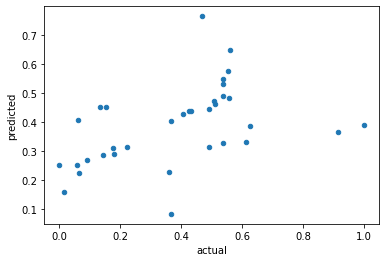

In [53]:
freq_comparison_df.plot(x = "actual", y = "predicted", kind = "scatter")
None

In [54]:
freq_model2[:-1].get_feature_names_out()

array(['polynomialfeatures__1', 'polynomialfeatures__meiv2',
       'polynomialfeatures__aswi'], dtype=object)

In [55]:
# higher r^2 value than the severity model
r2_score(freq_comparison_df["actual"], freq_comparison_df["predicted"])

0.1742621416439183

In [56]:
sev_transformer2 = make_column_transformer(
(PolynomialFeatures(degree = 1), ["meiv2", "aswi"]),
)

sev_model2 = Pipeline([
    ("trans", sev_transformer2),
    ("std", StandardScaler()),
    ("linreg", LinearRegression())
])

In [57]:
# leave one out cross validation code: severity modeling
sev_error_dict = dict()
sev_predictions = dict()

for idx in full_dataset.index:
    train = full_dataset[full_dataset.index != idx]
    test = full_dataset[full_dataset.index == idx]
    sev_model2.fit(train[["meiv2", "aswi"]], train["sev"])
    predicted = sum(sev_model2.predict(test[["meiv2", "aswi"]]))
    actual = sum(test["freq"])
    error_size = predicted - actual
    sev_error_dict[idx] = error_size
    sev_predictions[idx] = dict({"actual": actual, "predicted": predicted})

In [58]:
sev_error_dict

{1980: -0.0935388631999346,
 1981: 0.04623726058853661,
 1982: 0.21534536563986037,
 1983: 0.3128508529438976,
 1984: 0.11695955349114717,
 1985: 0.12337640507988196,
 1986: 0.24465296049473148,
 1987: -0.14207139627714005,
 1988: 0.48313510834697665,
 1989: 0.01466971209615675,
 1990: -0.12395046423986944,
 1991: 0.23643424303548308,
 1992: 0.1792142373555566,
 1993: 0.21546395393095294,
 1994: 0.2457806950520227,
 1995: -0.4764085750891611,
 1996: 0.011790550501937114,
 1997: 0.20736396642059382,
 1998: 0.07313304172601798,
 1999: 0.07951317254254253,
 2000: 0.06776009543754602,
 2001: 0.11744974678916592,
 2002: -0.08962031930415759,
 2003: 0.07381822607705724,
 2004: -0.14603741123999386,
 2005: -0.5102594096924862,
 2006: 0.11209187663546835,
 2007: 0.3386927165323339,
 2008: 0.07636576516472349,
 2009: 0.4121612591082371,
 2010: 0.0730813130735688,
 2011: -0.0019307454392622492,
 2012: -0.19149958623989516,
 2013: 0.35496283888096225}

In [59]:
sum([abs(number) for number in list(sev_error_dict.values())])

6.20762168766726

In [60]:
sev_comparison_df = pd.DataFrame(sev_predictions).transpose()
sev_comparison_df

,actual,predicted
1980,0.493031,0.399492
1981,0.510453,0.556690
1982,0.015679,0.231025
1983,0.000000,0.312851
1984,0.405923,0.522883
1985,0.367596,0.490972
1986,0.090592,0.335245
1987,0.367596,0.225524
1988,0.468641,0.951776
1989,0.508711,0.523381


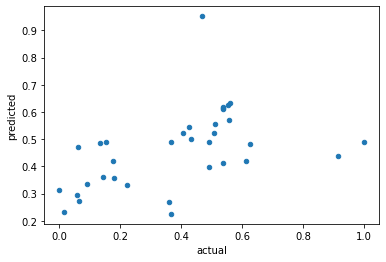

In [61]:
sev_comparison_df.plot(x = "actual", y = "predicted", kind = "scatter")
None

In [62]:
sev_model2[:-1].get_feature_names_out()

array(['polynomialfeatures__1', 'polynomialfeatures__meiv2',
       'polynomialfeatures__aswi'], dtype=object)

In [63]:
# lower r^2 value than the frequency model
r2_score(sev_comparison_df["actual"], sev_comparison_df["predicted"])

0.11100109660182045

In [64]:
# looking at some random combinations of ASWI and MEI v2 values

# overall, it seems like changes in the African Southwesterly Index value influence the severity prediction more than 
# frequency... I would've thought that it would matter more for frequency, but Cape Verde storms (forming off of Africa) 
# often represent the strongest storms in a given Atlantic hurricane season

# changes in the MEI v2 value appear to influence the predicted severity and fequency ratings in similar ways
# MEI v2 changes also seems to move the predicted severity and frequency ratings more than a comparable shift in the African
# Southwesterly Index, suggesting that MEI v2 could be the more powerful predictor of the two

In [65]:
float(freq_model2.predict(pd.DataFrame({"aswi": [0], "meiv2": [2.5]})))

0.002342117435633062

In [66]:
float(freq_model2.predict(pd.DataFrame({"aswi": [40], "meiv2": [2.5]})))

0.13970962955859867

In [67]:
float(freq_model2.predict(pd.DataFrame({"aswi": [0], "meiv2": [-2.5]})))

0.6535581945901574

In [68]:
float(freq_model2.predict(pd.DataFrame({"aswi": [40], "meiv2": [-2.5]})))

0.790925706713123

In [69]:
float(sev_model2.predict(pd.DataFrame({"aswi": [0], "meiv2": [2.5]})))

0.046306066874148066

In [70]:
float(sev_model2.predict(pd.DataFrame({"aswi": [40], "meiv2": [2.5]})))

0.2907944440664456

In [71]:
float(sev_model2.predict(pd.DataFrame({"aswi": [0], "meiv2": [-2.5]})))

0.656232498329672

In [72]:
float(sev_model2.predict(pd.DataFrame({"aswi": [40], "meiv2": [-2.5]})))

0.9007208755219696

In [73]:
# now, need to find some measure to replace the African Southwesterly Index, which cuts off in 2013 obviously
# thinking of investigating country/city rainfall data for the month of July in coastal West Africa, where tropical waves
# can originate... Senegal, Gambia, and Guinea-Bissau are in my "zone of interest," with the largest city there being Dakar,
# Senegal... unfortunately, getting daily/monthly precipitation data back to 1980 is not easy/impossible for these areas

# if all else fails, we could just add some additional predictors based on average SSTs in various tropical/subtropical 
# Atlantic zones (or use the Atlantic Multidecadal Oscillation, AMO, index, which seems to include all of the North Atlantic)
# AMO index data: https://psl.noaa.gov/data/timeseries/AMO/ (unsmooth, long format used; used July index!)

In [74]:
for key in no_aswi_df:
    for line in open("psl.noaa.gov_data_correlation_amon.us.long.data.txt"):
        split_line = line.split()
        if int(split_line[0]) == key:
            no_aswi_df[key]["amo"] = float(split_line[7])

no_aswi_df

{1980: {'freq': 0.4930313588850174,
  'sev': 0.4800444518182257,
  'meiv2': 0.52,
  'aswi': 19.4,
  'amo': 0.038},
 1981: {'freq': 0.5104529616724739,
  'sev': 0.2735172188558273,
  'meiv2': -0.51,
  'aswi': 22.6,
  'amo': -0.102},
 1982: {'freq': 0.0156794425087108,
  'sev': 0.1635911501540768,
  'meiv2': 1.87,
  'aswi': 16.1,
  'amo': -0.236},
 1983: {'freq': 0.0,
  'sev': 0.060489190655420126,
  'meiv2': 0.88,
  'aswi': 9.7,
  'amo': -0.023},
 1984: {'freq': 0.4059233449477352,
  'sev': 0.2230002996144978,
  'meiv2': -0.23,
  'aswi': 22.6,
  'amo': -0.274},
 1985: {'freq': 0.367595818815331,
  'sev': 0.4012700201556098,
  'meiv2': -0.02,
  'aswi': 22.6,
  'amo': -0.161},
 1986: {'freq': 0.09059233449477352,
  'sev': 0.20976433009809456,
  'meiv2': 0.77,
  'aswi': 12.9,
  'amo': -0.258},
 1987: {'freq': 0.367595818815331,
  'sev': 0.0,
  'meiv2': 1.74,
  'aswi': 9.7,
  'amo': 0.27},
 1988: {'freq': 0.4686411149825784,
  'sev': 0.34275949421956214,
  'meiv2': -1.77,
  'aswi': 38.7,
  

In [75]:
pd.DataFrame(no_aswi_df).transpose()

,freq,sev,meiv2,aswi,amo
1980,0.493031,0.480044,0.52,19.4,0.038
1981,0.510453,0.273517,-0.51,22.6,-0.102
1982,0.015679,0.163591,1.87,16.1,-0.236
1983,0.000000,0.060489,0.88,9.7,-0.023
1984,0.405923,0.223000,-0.23,22.6,-0.274
1985,0.367596,0.401270,-0.02,22.6,-0.161
1986,0.090592,0.209764,0.77,12.9,-0.258
1987,0.367596,0.000000,1.74,9.7,0.270
1988,0.468641,0.342759,-1.77,38.7,0.098
1989,0.508711,0.538469,-1.11,9.7,0.164


In [76]:
# next: add cloud cover and wind speed/direction data for July (1980-present) from Dakar, Senegal using Visual Crossing
# update: the July precipitation data for Dakar actually looks good for our whole time period, so we will use that instead!

In [77]:
for line in open("cleaned_july_rainfall.csv"):
    line_list = line.split(",")
    try:
        if int(line_list[0]) in no_aswi_df:
            no_aswi_df[int(line_list[0])]["dakar"] = float(line_list[1].strip())
    except:
        continue

no_aswi_df

{1980: {'freq': 0.4930313588850174,
  'sev': 0.4800444518182257,
  'meiv2': 0.52,
  'aswi': 19.4,
  'amo': 0.038,
  'dakar': 0.965},
 1981: {'freq': 0.5104529616724739,
  'sev': 0.2735172188558273,
  'meiv2': -0.51,
  'aswi': 22.6,
  'amo': -0.102,
  'dakar': 2.840689655},
 1982: {'freq': 0.0156794425087108,
  'sev': 0.1635911501540768,
  'meiv2': 1.87,
  'aswi': 16.1,
  'amo': -0.236,
  'dakar': 4.036},
 1983: {'freq': 0.0,
  'sev': 0.060489190655420126,
  'meiv2': 0.88,
  'aswi': 9.7,
  'amo': -0.023,
  'dakar': 0.0},
 1984: {'freq': 0.4059233449477352,
  'sev': 0.2230002996144978,
  'meiv2': -0.23,
  'aswi': 22.6,
  'amo': -0.274,
  'dakar': 1.552},
 1985: {'freq': 0.367595818815331,
  'sev': 0.4012700201556098,
  'meiv2': -0.02,
  'aswi': 22.6,
  'amo': -0.161,
  'dakar': 13.15},
 1986: {'freq': 0.09059233449477352,
  'sev': 0.20976433009809456,
  'meiv2': 0.77,
  'aswi': 12.9,
  'amo': -0.258,
  'dakar': 0.945},
 1987: {'freq': 0.367595818815331,
  'sev': 0.0,
  'meiv2': 1.74,
  '

In [78]:
new_full_dataset = pd.DataFrame(no_aswi_df).transpose().drop(columns = "aswi")

In [79]:
new_full_dataset

,freq,sev,meiv2,amo,dakar
1980,0.493031,0.480044,0.52,0.038,0.96500
1981,0.510453,0.273517,-0.51,-0.102,2.84069
1982,0.015679,0.163591,1.87,-0.236,4.03600
1983,0.000000,0.060489,0.88,-0.023,0.00000
1984,0.405923,0.223000,-0.23,-0.274,1.55200
1985,0.367596,0.401270,-0.02,-0.161,13.15000
1986,0.090592,0.209764,0.77,-0.258,0.94500
1987,0.367596,0.000000,1.74,0.270,2.20800
1988,0.468641,0.342759,-1.77,0.098,0.37400
1989,0.508711,0.538469,-1.11,0.164,3.42400


In [80]:
# now, we can do similar model fitting and testing from above based on our 3 predictors: MEI v2, AMO index, and Dakar, 
# Senegal rainfall

In [81]:
train, test = train_test_split(new_full_dataset)
train

,freq,sev,meiv2,amo,dakar
1983,0.000000,0.060489,0.88,-0.023,0.000
2014,0.080139,0.799106,0.39,0.200,0.028
1999,0.538328,0.737487,-1.21,0.179,0.000
1982,0.015679,0.163591,1.87,-0.236,4.036
2012,0.613240,0.495709,0.37,0.354,2.685
2002,0.360627,0.343347,0.39,-0.085,0.031
2005,1.000000,0.648170,-0.08,0.427,3.264
1980,0.493031,0.480044,0.52,0.038,0.965
1997,0.064460,0.465934,2.07,0.042,0.787
2001,0.426829,0.477559,-0.02,0.116,2.733


In [82]:
test

,freq,sev,meiv2,amo,dakar
2007,0.151568,0.551525,-0.65,0.109,3.63400
2011,0.493031,0.592993,-0.87,0.071,0.82200
1981,0.510453,0.273517,-0.51,-0.102,2.84069
2003,0.538328,0.702731,-0.07,0.257,5.41000
1990,0.536585,0.295092,0.27,-0.035,1.06200
2015,0.193380,0.471761,1.66,0.110,2.39400
1994,0.175958,0.097784,0.93,-0.248,0.12200
2016,0.505226,0.642136,-0.51,0.410,1.11100
2017,0.581882,1.000000,-0.86,0.280,3.62300
1986,0.090592,0.209764,0.77,-0.258,0.94500


In [83]:
freq_transformer3 = make_column_transformer(
(PolynomialFeatures(degree = 1), ["meiv2", "amo", "dakar"]),
)

freq_model3 = Pipeline([
    ("trans", freq_transformer3),
    ("std", StandardScaler()),
    ("linreg", LinearRegression())
])

In [84]:
freq_model3.fit(train[["meiv2", "amo", "dakar"]], train["freq"])

Pipeline(steps=[('trans',
                 ColumnTransformer(transformers=[('polynomialfeatures',
                                                  PolynomialFeatures(degree=1),
                                                  ['meiv2', 'amo', 'dakar'])])),
                ('std', StandardScaler()), ('linreg', LinearRegression())])

In [85]:
freq_model3.predict(test[["meiv2", "amo", "dakar"]])

array([0.45325846, 0.41791588, 0.32466691, 0.51389197, 0.2934968 ,
       0.29772265, 0.13007388, 0.57810338, 0.55675012, 0.14315359,
       0.4217982 ])

In [86]:
test["freq"]

2007    0.151568
2011    0.493031
1981    0.510453
2003    0.538328
1990    0.536585
2015    0.193380
1994    0.175958
2016    0.505226
2017    0.581882
1986    0.090592
2009    0.060976
Name: freq, dtype: float64

In [87]:
sum(abs(freq_model3.predict(test[["meiv2", "amo", "dakar"]]) - test["freq"]))

1.4917354855066125

In [88]:
freq_error_dict = dict()
freq_predictions = dict()

for idx in new_full_dataset.index:
    train = new_full_dataset[new_full_dataset.index != idx]
    test = new_full_dataset[new_full_dataset.index == idx]
    freq_model3.fit(train[["meiv2", "amo", "dakar"]], train["freq"])
    pred = float(freq_model3.predict(test[["meiv2", "amo", "dakar"]]))
    actual = float(test["freq"])
    differential = pred - actual
    freq_error_dict[idx] = differential
    freq_predictions[idx] = {"actual": actual, "pred": pred}

In [89]:
sum([abs(value) for value in freq_error_dict.values()])

6.7910019837986635

In [90]:
freq_comparison = pd.DataFrame(freq_predictions).transpose()
freq_comparison

,actual,pred
1980,0.493031,0.303286
1981,0.510453,0.331143
1982,0.015679,0.121051
1983,0.000000,0.266271
1984,0.405923,0.214664
1985,0.367596,0.318434
1986,0.090592,0.170454
1987,0.367596,0.314219
1988,0.468641,0.517951
1989,0.508711,0.507802


In [91]:
r2_score(freq_comparison["actual"], freq_comparison["pred"])

0.263112004993323

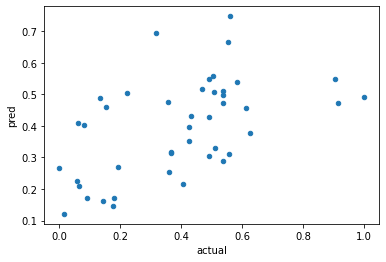

In [92]:
freq_comparison.plot(x = "actual", y = "pred", kind = "scatter")
None

In [93]:
freq_model3.fit(new_full_dataset[["meiv2", "amo", "dakar"]], new_full_dataset["freq"])

Pipeline(steps=[('trans',
                 ColumnTransformer(transformers=[('polynomialfeatures',
                                                  PolynomialFeatures(degree=1),
                                                  ['meiv2', 'amo', 'dakar'])])),
                ('std', StandardScaler()), ('linreg', LinearRegression())])

In [94]:
float(freq_model3.predict(pd.DataFrame({"meiv2": [-2], "amo": [.4], "dakar": [10]})))

0.7209574500552123

In [95]:
train, test = train_test_split(new_full_dataset)

In [96]:
sev_transformer3 = make_column_transformer(
(PolynomialFeatures(degree = 1), ["meiv2", "amo", "dakar"]),
)

sev_model3 = Pipeline([
    ("trans", sev_transformer3),
    ("std", StandardScaler()),
    ("linreg", LinearRegression())
])

In [97]:
sev_model3.fit(train[["meiv2", "amo", "dakar"]], train["sev"])

Pipeline(steps=[('trans',
                 ColumnTransformer(transformers=[('polynomialfeatures',
                                                  PolynomialFeatures(degree=1),
                                                  ['meiv2', 'amo', 'dakar'])])),
                ('std', StandardScaler()), ('linreg', LinearRegression())])

In [98]:
sev_model3.predict(test[["meiv2", "amo", "dakar"]])

array([0.28251008, 0.6171025 , 0.27377454, 0.50419427, 0.58200008,
       0.21474323, 0.51027635, 0.3846329 , 0.27241469, 0.47636319,
       0.31171157])

In [99]:
test["sev"]

1986    0.209764
1989    0.538469
1993    0.253136
2009    0.612904
2003    0.702731
1982    0.163591
2001    0.477559
2002    0.343347
1994    0.097784
2018    0.623070
1997    0.465934
Name: sev, dtype: float64

In [100]:
sum(abs(sev_model3.predict(test[["meiv2", "amo", "dakar"]]) - test["sev"]))

1.002173650220024

In [101]:
sev_error_dict = dict()
sev_predictions = dict()

for idx in new_full_dataset.index:
    train = new_full_dataset[new_full_dataset.index != idx]
    test = new_full_dataset[new_full_dataset.index == idx]
    sev_model3.fit(train[["meiv2", "amo", "dakar"]], train["sev"])
    pred = float(sev_model3.predict(test[["meiv2", "amo", "dakar"]]))
    actual = float(test["sev"])
    differential = pred - actual
    sev_error_dict[idx] = differential
    sev_predictions[idx] = {"actual": actual, "pred": pred}

In [102]:
sum([abs(value) for value in sev_error_dict.values()])

5.893191089196639

In [103]:
sev_comparison = pd.DataFrame(sev_predictions).transpose()
sev_comparison

,actual,pred
1980,0.480044,0.427919
1981,0.273517,0.446969
1982,0.163591,0.217781
1983,0.060489,0.390345
1984,0.223000,0.337203
1985,0.401270,0.430939
1986,0.209764,0.266200
1987,0.000000,0.564868
1988,0.342759,0.654097
1989,0.538469,0.620237


In [104]:
r2_score(sev_comparison["actual"], sev_comparison["pred"])

0.32464232100048585

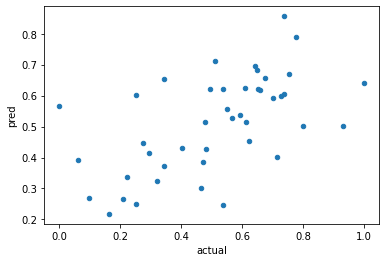

In [105]:
sev_comparison.plot(x = "actual", y = "pred", kind = "scatter")
None

In [106]:
sev_model3.fit(new_full_dataset[["meiv2", "amo", "dakar"]], new_full_dataset["sev"])

Pipeline(steps=[('trans',
                 ColumnTransformer(transformers=[('polynomialfeatures',
                                                  PolynomialFeatures(degree=1),
                                                  ['meiv2', 'amo', 'dakar'])])),
                ('std', StandardScaler()), ('linreg', LinearRegression())])

In [107]:
float(sev_model3.predict(pd.DataFrame({"meiv2": [-2], "amo": [.4], "dakar": [10]})))

0.8260095868243079

In [108]:
# going to change my source of AMO index data to the following link: 
# https://www1.ncdc.noaa.gov/pub/data/cmb/ersst/v5/index/ersst.v5.amo.dat

# it appears my original AMO index data source isn't being updated because its corresponding Atlantic SST data set isn't 
# being updated

# obviously, I want to predict future Atlantic hurricane seasons' frequency and severity ratings, so my data sets need to be 
# kept up to date, so I could get a prediction from a model at the end of July every year

In [109]:
amo_list = list()

for line in open("amo_updated.txt"):
    listed_line = line.split()
    try:
        year = int(listed_line[0])
    except:
        continue
    if year >= 1980 and year <= 2022:
        month = int(listed_line[1])
        if month == 7:
            amo_list.append(float(listed_line[2]))

new_full_dataset["amo"] = amo_list
new_full_dataset

,freq,sev,meiv2,amo,dakar
1980,0.493031,0.480044,0.52,0.06,0.96500
1981,0.510453,0.273517,-0.51,0.02,2.84069
1982,0.015679,0.163591,1.87,-0.20,4.03600
1983,0.000000,0.060489,0.88,0.08,0.00000
1984,0.405923,0.223000,-0.23,-0.26,1.55200
1985,0.367596,0.401270,-0.02,-0.07,13.15000
1986,0.090592,0.209764,0.77,-0.19,0.94500
1987,0.367596,0.000000,1.74,0.42,2.20800
1988,0.468641,0.342759,-1.77,0.26,0.37400
1989,0.508711,0.538469,-1.11,0.40,3.42400


In [110]:
freq_model3

Pipeline(steps=[('trans',
                 ColumnTransformer(transformers=[('polynomialfeatures',
                                                  PolynomialFeatures(degree=1),
                                                  ['meiv2', 'amo', 'dakar'])])),
                ('std', StandardScaler()), ('linreg', LinearRegression())])

In [111]:
freq_error_dict = dict()
freq_pred_actual_dict = dict()

for idx in new_full_dataset.index:
    train = new_full_dataset[new_full_dataset.index != idx]
    test = new_full_dataset[new_full_dataset.index == idx]
    freq_model3.fit(train[["meiv2", "amo", "dakar"]], train["freq"])
    pred = float(freq_model3.predict(test[["meiv2", "amo", "dakar"]]))
    actual = float(test["freq"])
    error = pred - actual
    freq_error_dict[idx] = error
    freq_pred_actual_dict[idx] = {"pred": pred, "actual": actual}

In [112]:
sum([abs(value) for value in freq_error_dict.values()])

6.850498244301349

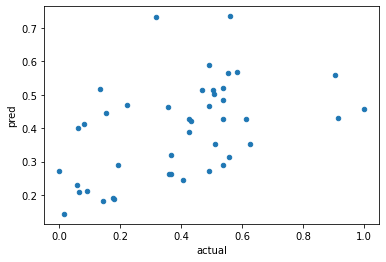

In [113]:
freq_comparison_df = pd.DataFrame(freq_pred_actual_dict).transpose()
freq_comparison_df.plot(x = "actual", y = "pred", kind = "scatter")
None

In [114]:
r2_score(freq_comparison_df["actual"], freq_comparison_df["pred"])

0.21460608417478055

In [115]:
sev_model3

Pipeline(steps=[('trans',
                 ColumnTransformer(transformers=[('polynomialfeatures',
                                                  PolynomialFeatures(degree=1),
                                                  ['meiv2', 'amo', 'dakar'])])),
                ('std', StandardScaler()), ('linreg', LinearRegression())])

In [116]:
sev_error_dict = dict()
sev_pred_actual_dict = dict()

for idx in new_full_dataset.index:
    train = new_full_dataset[new_full_dataset.index != idx]
    test = new_full_dataset[new_full_dataset.index == idx]
    sev_model3.fit(train[["meiv2", "amo", "dakar"]], train["sev"])
    pred = float(sev_model3.predict(test[["meiv2", "amo", "dakar"]]))
    actual = float(test["sev"])
    error = pred - actual
    sev_error_dict[idx] = error
    sev_pred_actual_dict[idx] = {"pred": pred, "actual": actual}

In [117]:
sum([abs(value) for value in sev_error_dict.values()])

5.901744432930703

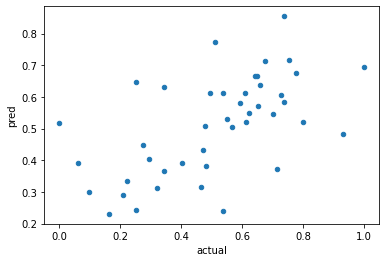

In [118]:
sev_comparison_df = pd.DataFrame(sev_pred_actual_dict).transpose()
sev_comparison_df.plot(x = "actual", y = "pred", kind = "scatter")
None

In [119]:
r2_score(sev_comparison_df["actual"], sev_comparison_df["pred"])

0.32571430177133043

In [120]:
# our r^2 score went down for the frequency prediction model but it stayed pretty much flat for our severity prediction model
# at least I can use these models to predict this year's frequency and severity of Atlantic hurricanes though

In [121]:
# June/July 2023 MEI v2 is .25
# July 2023 AMO index is 1.40
# July 2023 Dakar, Senegal rainfall is 1.47 inches
# so...

freq_model3.fit(new_full_dataset[["meiv2", "amo", "dakar"]], new_full_dataset["freq"])
float(freq_model3.predict(pd.DataFrame({"meiv2": [.25], "amo": [1.40], "dakar": [1.47]})))

0.6308628199816586

In [122]:
sev_model3.fit(new_full_dataset[["meiv2", "amo", "dakar"]], new_full_dataset["sev"])
float(sev_model3.predict(pd.DataFrame({"meiv2": [.25], "amo": [1.40], "dakar": [1.47]})))

0.8730742571032617

In [123]:
# a strong Atlantic hurricane season is predicted for this year, and so far, this is verifying
# greater predicted severity than all years (1980-2022) from our leave one out cross validation approach
# 3rd greatest predicted frequency out of all years (1980-2022) from the leave one out cross validation testing
# the question becomes if this season is just "above average" so far or "historic" (so far, the former is more true)

In [124]:
# next up: add another predictor (maybe something related to wind shear?) or maybe try to remove the Dakar rainfall predictor
# I'd also like to see if yet another source of AMO index data improves our model performance, since accuracy appeared to 
# decrease for frequency prediction with the AMO data being used above

In [125]:
freq_transformer4 = make_column_transformer(
(PolynomialFeatures(degree = 1), ["meiv2", "amo", "dakar"]),
)

freq_model4 = Pipeline([
    ("trans", freq_transformer4),
    ("std", StandardScaler()),
    ("tree", DecisionTreeRegressor(max_depth = 3, min_samples_leaf = 5))
])

In [126]:
freq_model4.fit(new_full_dataset[["meiv2", "amo", "dakar"]], new_full_dataset["freq"])

Pipeline(steps=[('trans',
                 ColumnTransformer(transformers=[('polynomialfeatures',
                                                  PolynomialFeatures(degree=1),
                                                  ['meiv2', 'amo', 'dakar'])])),
                ('std', StandardScaler()),
                ('tree',
                 DecisionTreeRegressor(max_depth=3, min_samples_leaf=5))])

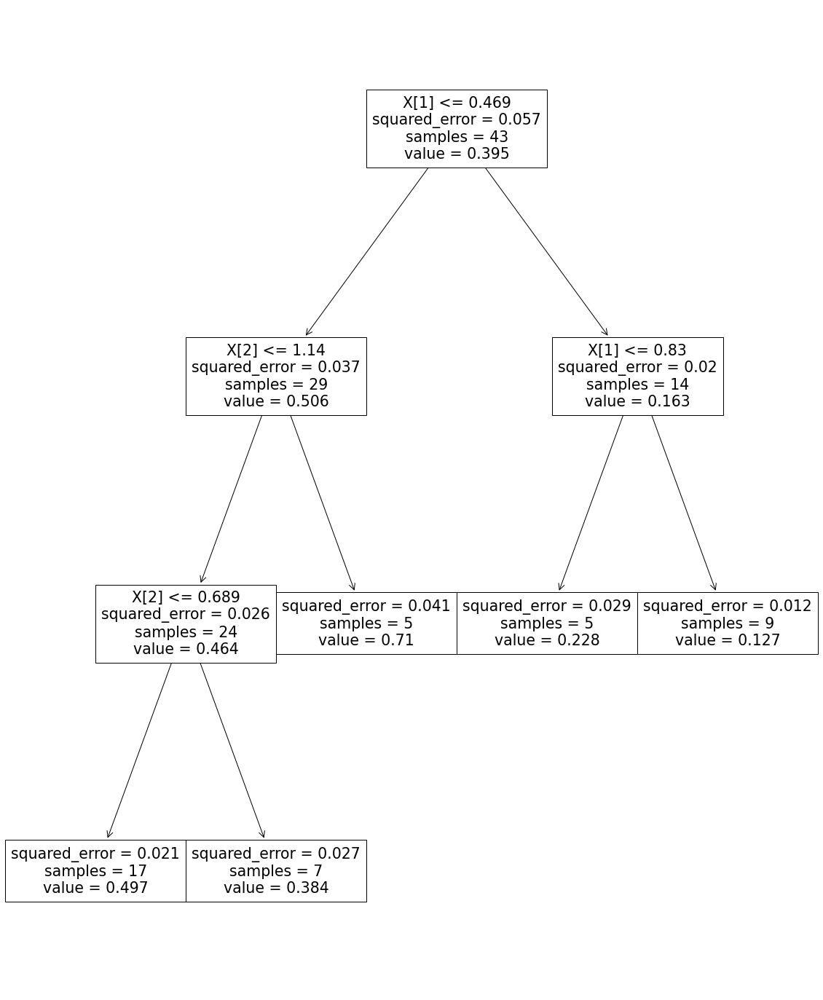

In [127]:
fig = plt.figure(figsize = (20,25))
placeholder = plot_tree(freq_model4.named_steps["tree"])

In [128]:
# 2023 frequency prediction again...
float(freq_model4.predict(pd.DataFrame({"meiv2": [.25], "amo": [1.40], "dakar": [1.47]})))

0.7101045296167248

In [129]:
sev_transformer4 = make_column_transformer(
(PolynomialFeatures(degree = 1), ["meiv2", "amo", "dakar"]),
)

sev_model4 = Pipeline([
    ("trans", freq_transformer4),
    ("std", StandardScaler()),
    ("tree", DecisionTreeRegressor(max_depth = 3, min_samples_leaf = 5))
])

In [130]:
sev_model4.fit(new_full_dataset[["meiv2", "amo", "dakar"]], new_full_dataset["sev"])

Pipeline(steps=[('trans',
                 ColumnTransformer(transformers=[('polynomialfeatures',
                                                  PolynomialFeatures(degree=1),
                                                  ['meiv2', 'amo', 'dakar'])])),
                ('std', StandardScaler()),
                ('tree',
                 DecisionTreeRegressor(max_depth=3, min_samples_leaf=5))])

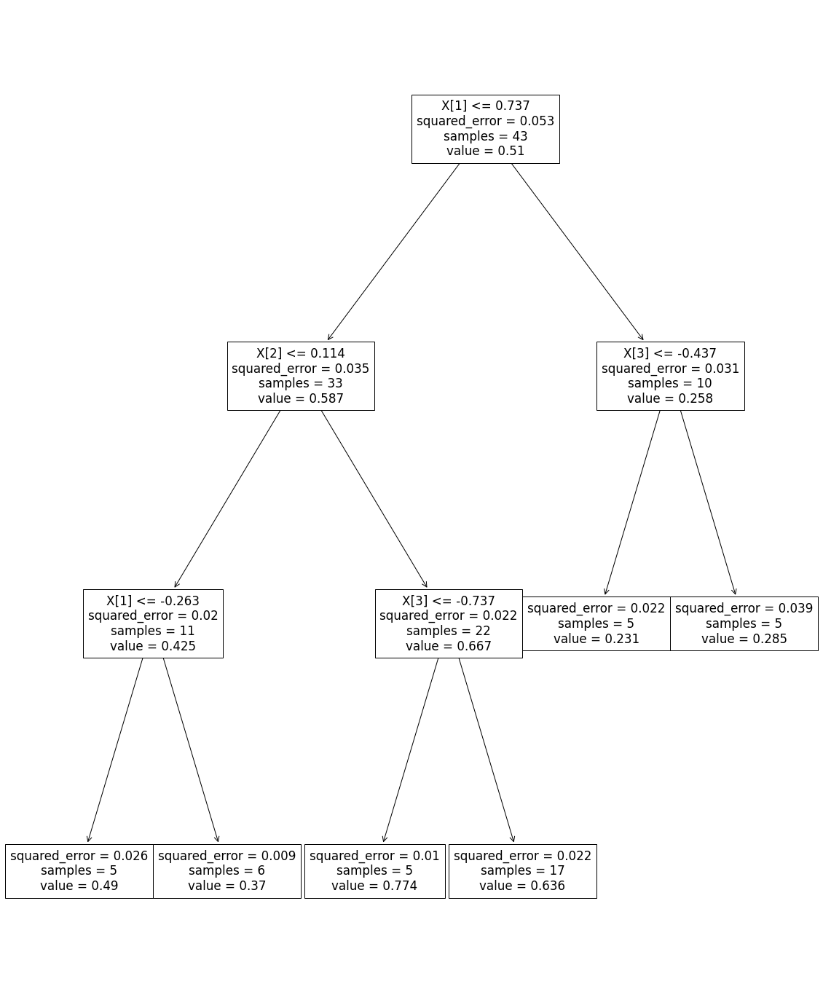

In [131]:
fig = plt.figure(figsize = (20,25))
placeholder = plot_tree(sev_model4.named_steps["tree"])

In [132]:
# 2023 frequency prediction again...
float(sev_model4.predict(pd.DataFrame({"meiv2": [.25], "amo": [1.40], "dakar": [1.47]})))

0.6362184104178485

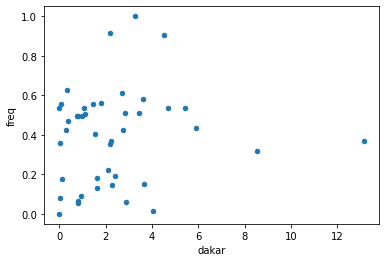

In [133]:
# exploring the relationship of freq/sev vs. Dakar, Senegal July rainfall
new_full_dataset.plot(x = "dakar", y = "freq", kind = "scatter")
None

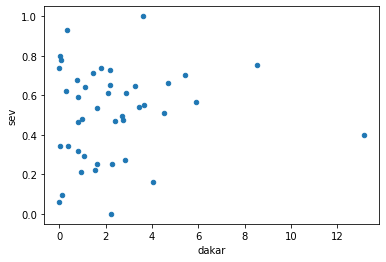

In [134]:
new_full_dataset.plot(x = "dakar", y = "sev", kind = "scatter")
None

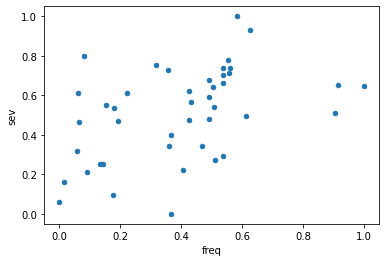

In [135]:
# frequency vs. severity
new_full_dataset.plot(x = "freq", y = "sev", kind = "scatter")
None

In [136]:
intensification_dict = dict()

for line in open("nhc.noaa.gov_data_hurdat_hurdat2-1851-2022-050423.txt"):
    row = line.split(",")
    if "AL" in row[0]:
        print(row)
        continue
    else:
        if int(row[1][1:3]) % 6 == 0:
            print(row)
            
            
#     if "AL" in row[0]:
#         year = int(row[0][4:8])
#         storm_num = int(row[0][2:4])
#     else:     

['AL011851', '            UNNAMED', '     14', '\n']
['18510625', ' 0000', '  ', ' HU', ' 28.0N', '  94.8W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18510625', ' 0600', '  ', ' HU', ' 28.0N', '  95.4W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18510625', ' 1200', '  ', ' HU', ' 28.0N', '  96.0W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18510625', ' 1800', '  ', ' HU', ' 28.1N', '  96.5W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18510626', ' 0000', '  ', ' HU', ' 28.2N', '  97.0W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['18601020', ' 0600', '  ', ' HU', ' 23.7N', '  71.1W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18601020', ' 1200', '  ', ' HU', ' 24.0N', '  71.6W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18601020', ' 1800', '  ', ' HU', ' 24.2N', '  72.0W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18601021', ' 0000', '  ', ' HU', ' 24.5N', '  72.3W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18601021', ' 0600', '  ', ' HU', ' 24.7N', '  72.6W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18601021', ' 1200', '  ', ' HU', ' 25.

['18700904', ' 1800', '  ', ' TS', ' 19.7N', '  55.0W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL041870', '            UNNAMED', '     20', '\n']
['18700909', ' 0000', '  ', ' HU', ' 24.2N', '  64.0W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18700909', ' 0600', '  ', ' HU', ' 25.1N', '  64.4W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18700909', ' 1200', '  ', ' HU', ' 26.0N', '  65.0W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18700909', ' 1800', '  ', ' HU', ' 27.1N', '  65.6W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['18750914', ' 0600', '  ', ' TS', ' 23.4N', '  82.4W', '  60', '  992', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18750914', ' 1200', '  ', ' HU', ' 24.0N', '  83.9W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18750914', ' 1800', '  ', ' HU', ' 24.7N', '  85.4W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18750915', ' 0000', '  ', ' HU', ' 25.8N', '  87.1W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18750915', ' 0600', '  ', ' HU', ' 26.3N', '  89.1W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18750915', ' 1200', '  ', ' HU', ' 26.

['18781010', ' 0600', '  ', ' TS', ' 16.7N', '  42.7W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18781010', ' 1200', '  ', ' TS', ' 17.0N', '  43.7W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18781010', ' 1800', '  ', ' TS', ' 17.2N', '  44.8W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18781011', ' 0000', '  ', ' TS', ' 17.7N', '  45.8W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18781011', ' 0600', '  ', ' TS', ' 18.2N', '  46.8W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18781011', ' 1200', '  ', ' TS', ' 19.

['18810803', ' 0600', '  ', ' TS', ' 29.3N', '  88.1W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18810803', ' 1200', '  ', ' TS', ' 30.1N', '  88.3W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18810803', ' 1800', '  ', ' TS', ' 30.9N', '  88.4W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18810804', ' 0000', '  ', ' TD', ' 31.5N', '  88.6W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18810804', ' 0600', '  ', ' TD', ' 32.0N', '  88.8W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL031881', '            UNNAMED', '   

['18831024', ' 0600', '  ', ' TS', ' 36.0N', '  71.3W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18831024', ' 1200', '  ', ' TS', ' 37.0N', '  68.8W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18831024', ' 1800', '  ', ' TS', ' 38.0N', '  66.3W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18831025', ' 0000', '  ', ' EX', ' 39.2N', '  63.7W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18831025', ' 0600', '  ', ' EX', ' 40.3N', '  61.3W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18831025', ' 1200', '  ', ' EX', ' 41.

['18860818', ' 0000', '  ', ' HU', ' 12.6N', '  69.2W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18860818', ' 0600', '  ', ' HU', ' 12.8N', '  70.6W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18860818', ' 1200', '  ', ' HU', ' 13.0N', '  71.7W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18860818', ' 1800', '  ', ' HU', ' 13.2N', '  72.5W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18860819', ' 0000', '  ', ' HU', ' 13.7N', '  73.3W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18860819', ' 0600', '  ', ' HU', ' 14.

['18880815', ' 0000', '  ', ' TS', ' 23.8N', '  73.4W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18880815', ' 0600', '  ', ' TS', ' 24.1N', '  74.5W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18880815', ' 1200', '  ', ' HU', ' 24.3N', '  75.5W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18880815', ' 1800', '  ', ' HU', ' 24.6N', '  76.5W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18880816', ' 0000', '  ', ' HU', ' 24.8N', '  77.4W', '  90', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18880816', ' 0600', '  ', ' HU', ' 25.

['18890919', ' 0600', '  ', ' HU', ' 19.8N', '  92.3W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18890919', ' 1200', '  ', ' HU', ' 20.2N', '  92.9W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18890919', ' 1800', '  ', ' HU', ' 20.9N', '  93.1W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18890920', ' 0000', '  ', ' HU', ' 21.3N', '  93.1W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18890920', ' 0600', '  ', ' HU', ' 21.7N', '  93.1W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18890920', ' 1200', '  ', ' HU', ' 22.

['18920817', ' 1800', '  ', ' TS', ' 21.1N', '  64.3W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18920818', ' 0000', '  ', ' TS', ' 21.5N', '  65.0W', '  55', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18920818', ' 0600', '  ', ' TS', ' 22.0N', '  65.7W', '  55', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18920818', ' 1200', '  ', ' TS', ' 22.8N', '  66.3W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18920818', ' 1800', '  ', ' TS', ' 24.0N', '  67.0W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18920819', ' 0000', '  ', ' HU', ' 24.

['18930824', ' 0600', '  ', ' HU', ' 17.5N', '  37.8W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18930824', ' 1200', '  ', ' HU', ' 18.1N', '  38.4W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18930824', ' 1800', '  ', ' HU', ' 18.7N', '  39.0W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18930825', ' 0000', '  ', ' HU', ' 19.3N', '  39.6W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18930825', ' 0600', '  ', ' HU', ' 20.1N', '  40.1W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18930825', ' 1200', '  ', ' HU', ' 21.

['18951001', ' 0000', '  ', ' TS', ' 23.8N', '  85.8W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18951001', ' 0600', '  ', ' TS', ' 23.8N', '  84.5W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18951001', ' 1200', '  ', ' TS', ' 23.9N', '  83.4W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18951001', ' 1800', '  ', ' TS', ' 24.0N', '  82.5W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18951002', ' 0000', '  ', ' TS', ' 24.2N', '  81.5W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18951002', ' 0600', '  ', ' TS', ' 24.

['18980915', ' 1200', '  ', ' TS', ' 16.3N', '  83.1W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18980915', ' 1800', '  ', ' TS', ' 16.6N', '  84.0W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18980916', ' 0000', '  ', ' TS', ' 16.9N', '  85.1W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18980916', ' 0600', '  ', ' TS', ' 17.2N', '  86.3W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18980916', ' 1200', '  ', ' TS', ' 17.6N', '  87.5W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['18980916', ' 1800', '  ', ' TS', ' 18.

['19000901', ' 0000', '  ', ' TS', ' 17.5N', '  66.4W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19000901', ' 0600', '  ', ' TS', ' 17.6N', '  67.4W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19000901', ' 1200', '  ', ' TS', ' 17.7N', '  68.3W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19000901', ' 1800', '  ', ' TS', ' 18.0N', '  69.2W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19000902', ' 0000', '  ', ' TS', ' 18.3N', '  70.3W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19000902', ' 0600', '  ', ' TS', ' 18.

['19020622', ' 1800', '  ', ' TD', ' 19.2N', '  93.7W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19020623', ' 0000', '  ', ' TD', ' 19.5N', '  93.9W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19020623', ' 0600', '  ', ' TD', ' 19.7N', '  94.1W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19020623', ' 1200', '  ', ' TD', ' 20.0N', '  94.3W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19020623', ' 1800', '  ', ' TD', ' 20.3N', '  94.5W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19020624', ' 0000', '  ', ' TD', ' 20.

['19060912', ' 0000', '  ', ' EX', ' 49.5N', '  35.4W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19060912', ' 0600', '  ', ' EX', ' 51.3N', '  30.3W', '  55', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19060912', ' 1200', '  ', ' EX', ' 53.0N', '  25.0W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19060912', ' 1800', '  ', ' EX', ' 54.0N', '  20.3W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL051906', '            UNNAMED', '     63', '\n']
['19060903', ' 1200', '  ', ' TS', ' 10.2N', '  33.0W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['19090625', ' 1800', '  ', ' TS', ' 25.5N', '  84.7W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19090626', ' 0000', '  ', ' TS', ' 25.9N', '  85.5W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19090626', ' 0600', '  ', ' TS', ' 26.3N', '  86.2W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19090626', ' 1200', '  ', ' TS', ' 26.7N', '  87.0W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19090626', ' 1800', '  ', ' TS', ' 26.7N', '  87.7W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19090627', ' 0000', '  ', ' TS', ' 26.

['19100906', ' 0000', '  ', ' HU', ' 17.1N', '  61.7W', '  75', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19100906', ' 0600', '  ', ' HU', ' 17.2N', '  62.7W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19100906', ' 1200', '  ', ' HU', ' 17.4N', '  63.8W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19100906', ' 1800', '  ', ' HU', ' 17.5N', '  64.9W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19100907', ' 0000', '  ', ' HU', ' 17.5N', '  66.0W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19100907', ' 0600', '  ', ' HU', ' 17.

['19150818', ' 0600', '  ', ' TS', ' 31.0N', '  96.6W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19150818', ' 1200', '  ', ' TS', ' 31.3N', '  96.4W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19150818', ' 1800', '  ', ' TS', ' 31.7N', '  96.1W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19150819', ' 0000', '  ', ' TD', ' 32.3N', '  95.8W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19150819', ' 0600', '  ', ' TD', ' 32.9N', '  95.3W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19150819', ' 1200', '  ', ' TD', ' 33.

['19160914', ' 0000', '  ', ' TD', ' 20.8N', '  58.4W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19160914', ' 0600', '  ', ' TS', ' 20.9N', '  59.6W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19160914', ' 1200', '  ', ' TS', ' 21.0N', '  60.7W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19160914', ' 1800', '  ', ' TS', ' 21.1N', '  61.6W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19160915', ' 0000', '  ', ' TS', ' 21.2N', '  62.5W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19160915', ' 0600', '  ', ' TS', ' 21.

['19180908', ' 1200', '  ', ' EX', ' 49.0N', '  55.0W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL061918', '            UNNAMED', '     23', '\n']
['19180909', ' 0000', '  ', ' TS', ' 13.9N', '  59.8W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19180909', ' 0600', '  ', ' TS', ' 14.3N', '  60.7W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19180909', ' 1200', '  ', ' TS', ' 14.7N', '  61.6W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19180909', ' 1800', '  ', ' TS', ' 15.1N', '  62.5W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['19211028', ' 1800', '  ', ' HU', ' 27.3N', '  67.8W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19211029', ' 0000', '  ', ' HU', ' 26.8N', '  66.7W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19211029', ' 0600', '  ', ' HU', ' 26.6N', '  65.5W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19211029', ' 1200', '  ', ' HU', ' 26.5N', '  64.0W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19211029', ' 1800', '  ', ' TS', ' 27.0N', '  62.0W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19211030', ' 0000', '  ', ' EX', ' 28.

['19240826', ' 0000', '  ', ' TS', ' 13.7N', '  48.0W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19240826', ' 0600', '  ', ' TS', ' 13.7N', '  49.5W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19240826', ' 1200', '  ', ' TS', ' 13.8N', '  51.0W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19240826', ' 1800', '  ', ' TS', ' 14.0N', '  52.5W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19240827', ' 0000', '  ', ' TS', ' 14.4N', '  54.0W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19240827', ' 0600', '  ', ' TS', ' 14.

['19260908', ' 1200', '  ', ' HU', ' 23.6N', '  61.0W', ' 105', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19260908', ' 1800', '  ', ' HU', ' 24.0N', '  61.8W', ' 105', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19260909', ' 0000', '  ', ' HU', ' 24.2N', '  62.6W', ' 105', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19260909', ' 0600', '  ', ' HU', ' 24.3N', '  63.4W', ' 105', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19260909', ' 1200', '  ', ' HU', ' 24.4N', '  64.0W', ' 105', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19260909', ' 1800', '  ', ' HU', ' 24.

['19300831', ' 1800', '  ', ' HU', ' 14.4N', '  57.1W', '  65', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19300901', ' 0000', '  ', ' HU', ' 14.6N', '  58.4W', '  70', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19300901', ' 0600', '  ', ' HU', ' 14.9N', '  59.6W', '  75', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19300901', ' 1200', '  ', ' HU', ' 15.2N', '  60.8W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19300901', ' 1800', '  ', ' HU', ' 15.6N', '  62.0W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19300902', ' 0000', '  ', ' HU', ' 16.

['AL111931', '            UNNAMED', '     18', '\n']
['19311101', ' 1200', '  ', ' TD', ' 17.5N', '  83.5W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19311101', ' 1800', '  ', ' TD', ' 17.6N', '  83.8W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19311102', ' 0000', '  ', ' TS', ' 17.7N', '  84.1W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19311102', ' 0600', '  ', ' TS', ' 17.8N', '  84.3W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19311102', ' 1200', '  ', ' TS', ' 18.0N', '  84.5W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['19321031', ' 0000', '  ', ' TD', ' 14.9N', '  58.2W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19321031', ' 0600', '  ', ' TD', ' 14.9N', '  59.3W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19321031', ' 1200', '  ', ' TD', ' 14.8N', '  60.5W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19321031', ' 1800', '  ', ' TS', ' 14.8N', '  61.7W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19321101', ' 0000', '  ', ' TS', ' 14.7N', '  63.0W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19321101', ' 0600', '  ', ' TS', ' 14.

['19330829', ' 0600', '  ', ' TS', ' 22.0N', '  96.6W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19330829', ' 1200', '  ', ' TS', ' 22.0N', '  97.4W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19330829', ' 1800', '  ', ' TD', ' 21.9N', '  98.3W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19330830', ' 0000', '  ', ' TD', ' 21.5N', '  99.2W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL111933', '            UNNAMED', '     33', '\n']
['19330831', ' 0600', '  ', ' TS', ' 18.1N', '  56.4W', '  55', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['19341002', ' 1200', '  ', ' TD', ' 22.2N', '  86.3W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19341002', ' 1800', '  ', ' TD', ' 22.6N', '  86.8W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19341003', ' 0000', '  ', ' TS', ' 23.0N', '  87.3W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19341003', ' 0600', '  ', ' TS', ' 23.4N', '  87.8W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19341003', ' 1200', '  ', ' TS', ' 23.8N', '  88.2W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19341003', ' 1800', '  ', ' TS', ' 24.

['19360808', ' 1800', '  ', ' TS', ' 30.8N', '  68.4W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19360809', ' 0000', '  ', ' TS', ' 31.6N', '  67.6W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19360809', ' 0600', '  ', ' TS', ' 32.5N', '  66.8W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19360809', ' 1200', '  ', ' TS', ' 33.5N', '  65.9W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19360809', ' 1800', '  ', ' TS', ' 34.7N', '  64.8W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19360810', ' 0000', '  ', ' EX', ' 36.

['19370911', ' 0000', '  ', ' HU', ' 22.3N', '  57.5W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19370911', ' 0600', '  ', ' HU', ' 23.1N', '  58.0W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19370911', ' 1200', '  ', ' HU', ' 24.0N', '  58.5W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19370911', ' 1800', '  ', ' HU', ' 25.1N', '  59.1W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19370912', ' 0000', '  ', ' HU', ' 26.2N', '  59.6W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19370912', ' 0600', '  ', ' HU', ' 27.

['19410922', ' 0000', '  ', ' HU', ' 25.1N', '  90.1W', '  75', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19410922', ' 0600', '  ', ' HU', ' 25.4N', '  90.9W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19410922', ' 1200', '  ', ' HU', ' 25.9N', '  91.9W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19410922', ' 1800', '  ', ' HU', ' 26.3N', '  92.9W', '  90', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19410923', ' 0000', '  ', ' HU', ' 26.7N', '  93.9W', '  95', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19410923', ' 0600', '  ', ' HU', ' 27.

['19430816', ' 1800', '  ', ' TS', ' 27.0N', '  72.3W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19430817', ' 0000', '  ', ' TS', ' 27.9N', '  72.8W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19430817', ' 0600', '  ', ' TS', ' 28.8N', '  73.6W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19430817', ' 1200', '  ', ' TS', ' 29.6N', '  74.4W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19430817', ' 1800', '  ', ' TS', ' 30.3N', '  75.0W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19430818', ' 0000', '  ', ' TS', ' 31.

['19440927', ' 1800', '  ', ' EX', ' 55.5N', '  40.0W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19440928', ' 0000', '  ', ' EX', ' 57.8N', '  34.7W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19440928', ' 0600', '  ', ' EX', ' 59.6N', '  28.5W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19440928', ' 1200', '  ', ' EX', ' 61.4N', '  22.4W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL101944', '            UNNAMED', '     13', '\n']
['19440930', ' 0000', '  ', ' TS', ' 33.1N', '  44.1W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['19461001', ' 1200', '  ', ' TD', ' 32.5N', '  36.5W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19461001', ' 1800', '  ', ' TS', ' 32.7N', '  36.3W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19461002', ' 0000', '  ', ' TS', ' 33.0N', '  36.0W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19461002', ' 0600', '  ', ' TS', ' 33.2N', '  35.4W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19461002', ' 1200', '  ', ' TS', ' 33.5N', '  34.5W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19461002', ' 1800', '  ', ' TS', ' 33.

['19481004', ' 0600', '  ', ' TS', ' 18.8N', '  85.0W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19481004', ' 1200', '  ', ' TS', ' 19.5N', '  85.2W', '  55', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19481004', ' 1800', '  ', ' HU', ' 20.2N', '  85.0W', '  70', '  991', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19481005', ' 0000', '  ', ' HU', ' 21.2N', '  84.2W', '  90', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19481005', ' 0600', '  ', ' HU', ' 22.3N', '  83.3W', ' 110', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19481005', ' 1200', '  ', ' HU', ' 23.

['19500822', ' 1800', '  ', ' TS', ' 16.8N', '  62.9W', '  45', ' 1003', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19500823', ' 0000', '  ', ' TS', ' 17.0N', '  64.0W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19500823', ' 0600', '  ', ' TS', ' 17.4N', '  65.1W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19500823', ' 1200', '  ', ' TS', ' 17.8N', '  66.2W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19500823', ' 1800', '  ', ' TD', ' 18.2N', '  67.3W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19500824', ' 0000', '  ', ' TD', ' 18.

['19511018', ' 0600', '  ', ' EX', ' 33.7N', '  71.1W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19511018', ' 1200', '  ', ' EX', ' 33.5N', '  72.0W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19511018', ' 1800', '  ', ' EX', ' 33.2N', '  72.3W', '  55', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19511019', ' 0000', '  ', ' EX', ' 32.2N', '  72.6W', '  55', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19511019', ' 0600', '  ', ' EX', ' 31.6N', '  72.7W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19511019', ' 1200', '  ', ' EX', ' 31.

['AL111952', '            UNNAMED', '     25', '\n']
['19521124', ' 1800', '  ', ' EX', ' 22.5N', '  60.0W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19521125', ' 0000', '  ', ' EX', ' 23.2N', '  58.5W', '  35', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19521125', ' 0600', '  ', ' EX', ' 24.1N', '  57.0W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19521125', ' 1200', '  ', ' EX', ' 25.1N', '  56.0W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19521125', ' 1800', '  ', ' EX', ' 26.0N', '  55.3W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['19540904', ' 0000', '  ', ' EX', ' 48.3N', '  38.3W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19540904', ' 0600', '  ', ' EX', ' 48.5N', '  33.5W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19540904', ' 1200', '  ', ' EX', ' 48.5N', '  28.5W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19540904', ' 1800', '  ', ' EX', ' 48.5N', '  23.5W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL081954', '               EDNA', '     41', '\n']
['19540905', ' 0000', '  ', ' TD', ' 19.8N', '  65.3W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['19551011', ' 0000', '  ', ' TS', ' 28.8N', '  43.4W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19551011', ' 0600', '  ', ' TS', ' 28.8N', '  43.8W', '  55', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19551011', ' 1200', '  ', ' TS', ' 28.8N', '  44.2W', '  55', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19551011', ' 1800', '  ', ' TS', ' 29.0N', '  44.4W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19551012', ' 0000', '  ', ' TS', ' 29.4N', '  44.4W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19551012', ' 0600', '  ', ' TS', ' 29.

['19570913', ' 0000', '  ', ' HU', ' 24.3N', '  52.6W', ' 100', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19570913', ' 0600', '  ', ' HU', ' 25.0N', '  52.5W', ' 105', '  951', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19570913', ' 1200', '  ', ' HU', ' 25.7N', '  52.4W', ' 100', '  953', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19570913', ' 1800', '  ', ' HU', ' 26.4N', '  52.2W', '  90', '  963', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19570914', ' 0000', '  ', ' HU', ' 27.1N', '  52.3W', '  90', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19570914', ' 0600', '  ', ' HU', ' 27.

['19600913', ' 0000', '  ', ' TS', ' 42.8N', '  71.2W', '  60', '  969', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19600913', ' 0600', '  ', ' EX', ' 46.8N', '  68.6W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19600913', ' 1200', '  ', ' EX', ' 50.0N', '  66.0W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19600913', ' 1800', '  ', ' EX', ' 53.1N', '  62.5W', '  60', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19600914', ' 0000', '  ', ' EX', ' 56.0N', '  58.2W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19600914', ' 0600', '  ', ' EX', ' 58.

['19610930', ' 1200', '  ', ' TS', ' 16.1N', '  58.8W', '  40', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19610930', ' 1800', '  ', ' TS', ' 16.2N', '  59.6W', '  45', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19611001', ' 0000', '  ', ' TS', ' 16.2N', '  60.4W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19611001', ' 0600', '  ', ' TS', ' 16.2N', '  61.2W', '  50', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19611001', ' 1200', '  ', ' TS', ' 16.0N', '  62.3W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19611001', ' 1800', '  ', ' TS', ' 15.

['19640904', ' 0000', '  ', ' HU', ' 38.7N', '  56.9W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640904', ' 0600', '  ', ' HU', ' 41.5N', '  53.0W', '  85', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640904', ' 1200', '  ', ' EX', ' 44.7N', '  50.5W', '  85', '  970', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640904', ' 1800', '  ', ' EX', ' 46.9N', '  49.8W', '  80', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640905', ' 0000', '  ', ' EX', ' 48.8N', '  49.5W', '  75', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19640905', ' 0600', '  ', ' EX', ' 51.

['19641105', ' 0000', '  ', ' TD', ' 11.6N', '  80.1W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19641105', ' 0600', '  ', ' TD', ' 11.9N', '  80.5W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19641105', ' 1200', '  ', ' TD', ' 12.2N', '  80.8W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19641105', ' 1800', '  ', ' TD', ' 12.6N', '  81.0W', '  30', ' 1006', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19641106', ' 0000', '  ', ' TD', ' 13.0N', '  81.1W', '  30', ' 1003', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19641106', ' 0600', '  ', ' TS', ' 13.

['19660828', ' 0000', '  ', ' HU', ' 22.2N', '  70.0W', '  75', '  979', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19660828', ' 0600', '  ', ' HU', ' 22.7N', '  70.4W', '  80', '  973', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19660828', ' 1200', '  ', ' HU', ' 23.3N', '  70.7W', '  95', '  962', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19660828', ' 1800', '  ', ' HU', ' 23.8N', '  71.0W', ' 100', '  957', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19660829', ' 0000', '  ', ' HU', ' 24.2N', '  71.1W', ' 100', '  955', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19660829', ' 0600', '  ', ' HU', ' 24.

['19670913', ' 0000', '  ', ' TS', ' 16.2N', '  76.8W', '  35', ' 1004', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19670913', ' 0600', '  ', ' TS', ' 15.9N', '  77.3W', '  40', ' 1002', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19670913', ' 1200', '  ', ' TS', ' 15.8N', '  77.8W', '  45', '  997', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19670913', ' 1800', '  ', ' TS', ' 15.8N', '  78.2W', '  45', '  997', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19670914', ' 0000', '  ', ' TS', ' 15.9N', '  78.6W', '  45', '  996', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19670914', ' 0600', '  ', ' TS', ' 16.

['19691001', ' 0000', '  ', ' SS', ' 26.9N', '  86.6W', '  50', '  996', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19691001', ' 0600', '  ', ' SS', ' 27.9N', '  86.6W', '  50', '  995', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19691001', ' 1200', '  ', ' SS', ' 29.2N', '  86.7W', '  45', '  995', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19691001', ' 1800', '  ', ' SS', ' 30.8N', '  86.8W', '  35', '  999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19691002', ' 0000', '  ', ' SD', ' 33.0N', '  86.9W', '  25', ' 1001', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19691002', ' 0600', '  ', ' SD', ' 35.

['19700913', ' 1200', '  ', ' TD', ' 25.0N', '  80.0W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19700913', ' 1800', '  ', ' TD', ' 24.8N', '  81.0W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19700914', ' 0000', '  ', ' TD', ' 24.4N', '  82.0W', '  30', ' 1011', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19700914', ' 0600', '  ', ' TD', ' 24.2N', '  83.0W', '  30', ' 1010', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19700914', ' 1200', '  ', ' TD', ' 24.5N', '  84.1W', '  30', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19700914', ' 1800', '  ', ' TS', ' 25.

['19710910', ' 0000', '  ', ' HU', ' 28.0N', '  94.8W', '  70', '  988', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710910', ' 0600', '  ', ' HU', ' 28.5N', '  95.3W', '  65', '  988', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710910', ' 1200', '  ', ' TS', ' 28.5N', '  96.0W', '  60', '  979', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710910', ' 1800', '  ', ' TS', ' 28.3N', '  96.5W', '  60', '  979', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710911', ' 0000', '  ', ' TS', ' 28.0N', '  96.9W', '  55', '  988', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19710911', ' 0600', '  ', ' TS', ' 27.

['19720814', ' 0600', '  ', ' TD', ' 32.4N', '  74.9W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19720814', ' 1200', '  ', ' TD', ' 32.5N', '  74.5W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19720814', ' 1800', '  ', ' TD', ' 32.7N', '  74.1W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19720815', ' 0000', '  ', ' TD', ' 32.8N', '  73.7W', '  20', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19720815', ' 0600', '  ', ' TD', ' 32.9N', '  73.4W', '  20', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19720815', ' 1200', '  ', ' TD', ' 33.

['19740702', ' 0000', '  ', ' TD', ' 18.0N', '  32.0W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19740702', ' 0600', '  ', ' TD', ' 18.0N', '  34.0W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19740702', ' 1200', '  ', ' TD', ' 18.0N', '  36.0W', '  20', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL041974', '            UNNAMED', '     18', '\n']
['19740713', ' 1200', '  ', ' TD', ' 28.5N', '  87.0W', '  20', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19740713', ' 1800', '  ', ' TD', ' 28.2N', '  87.3W', '  20', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['19750902', ' 0600', '  ', ' HU', ' 36.4N', '  44.5W', '  95', '  965', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19750902', ' 1200', '  ', ' HU', ' 37.0N', '  44.3W', '  95', '  965', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19750902', ' 1800', '  ', ' HU', ' 37.7N', '  44.2W', '  95', '  965', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19750903', ' 0000', '  ', ' HU', ' 38.4N', '  43.8W', '  95', '  965', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19750903', ' 0600', '  ', ' HU', ' 39.7N', '  43.6W', '  95', '  965', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19750903', ' 1200', '  ', ' HU', ' 41.

['19760825', ' 1200', '  ', ' HU', ' 26.5N', '  62.1W', '  65', '  990', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19760825', ' 1800', '  ', ' HU', ' 26.6N', '  60.4W', '  65', '  991', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19760826', ' 0000', '  ', ' HU', ' 26.8N', '  59.0W', '  70', '  988', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19760826', ' 0600', '  ', ' HU', ' 27.0N', '  57.8W', '  75', '  984', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19760826', ' 1200', '  ', ' HU', ' 27.2N', '  56.2W', '  80', '  980', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19760826', ' 1800', '  ', ' HU', ' 27.

['19780731', ' 1200', '  ', ' TS', ' 28.0N', '  98.2W', '  35', ' 1008', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19780731', ' 1800', '  ', ' TD', ' 28.6N', '  98.7W', '  30', ' 1010', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19780801', ' 0000', '  ', ' TD', ' 29.3N', '  99.2W', '  25', ' 1010', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL051978', '               BESS', '     13', '\n']
['19780805', ' 1200', '  ', ' TD', ' 25.3N', '  90.4W', '  20', ' 1012', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19780805', ' 1800', '  ', ' TD', ' 25.1N', '  91.0W', '  20', ' 1012', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['19790716', ' 1200', '  ', ' TD', ' 15.7N', '  53.8W', '  30', ' 1011', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19790716', ' 1800', '  ', ' TD', ' 16.5N', '  55.5W', '  30', ' 1011', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19790717', ' 0000', '  ', ' TD', ' 17.0N', '  57.2W', '  30', ' 1011', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19790717', ' 0600', '  ', ' TD', ' 17.5N', '  58.8W', '  30', ' 1011', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19790717', ' 1200', '  ', ' TS', ' 17.8N', '  60.3W', '  35', ' 1011', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19790717', ' 1800', '  ', ' TS', ' 18.

['19800809', ' 0600', '  ', ' HU', ' 25.0N', '  94.2W', ' 155', '  909', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19800809', ' 1200', '  ', ' HU', ' 25.2N', '  95.4W', ' 140', '  916', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19800809', ' 1800', '  ', ' HU', ' 25.4N', '  96.1W', ' 125', '  925', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19800810', ' 0000', '  ', ' HU', ' 25.8N', '  96.8W', ' 110', '  935', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19800810', ' 0600', '  ', ' HU', ' 26.1N', '  97.2W', ' 100', '  945', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19800810', ' 1200', '  ', ' HU', ' 26.

['19811003', ' 0000', '  ', ' EX', ' 43.6N', '  11.5W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19811003', ' 0600', '  ', ' EX', ' 45.0N', '   4.0W', '  45', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL191981', '            UNNAMED', '     36', '\n']
['19810926', ' 0000', '  ', ' TD', '  8.0N', '  38.0W', '  20', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19810926', ' 0600', '  ', ' TD', '  8.2N', '  39.0W', '  20', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19810926', ' 1200', '  ', ' TD', '  8.7N', '  40.0W', '  25', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['19840819', ' 0600', '  ', ' SD', ' 36.5N', '  58.0W', '  30', ' 1001', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19840819', ' 1200', '  ', ' SS', ' 38.0N', '  56.4W', '  35', ' 1000', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19840819', ' 1800', '  ', ' SS', ' 39.6N', '  54.8W', '  35', ' 1000', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19840820', ' 0000', '  ', ' SS', ' 41.2N', '  53.2W', '  40', ' 1000', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19840820', ' 0600', '  ', ' SS', ' 42.5N', '  50.8W', '  45', ' 1000', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19840820', ' 1200', '  ', ' SS', ' 43.

['19870819', ' 1800', '  ', ' TS', ' 35.5N', '  47.5W', '  35', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19870820', ' 0000', '  ', ' TS', ' 35.0N', '  46.0W', '  35', ' 1004', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19870820', ' 0600', '  ', ' TS', ' 34.5N', '  44.5W', '  40', ' 1002', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19870820', ' 1200', '  ', ' TS', ' 34.0N', '  43.5W', '  40', ' 1000', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19870820', ' 1800', '  ', ' TS', ' 33.8N', '  43.0W', '  50', '  997', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19870821', ' 0000', '  ', ' TS', ' 33.

['19880918', ' 1200', '  ', ' TD', ' 29.3N', ' 102.6W', '  25', ' 1003', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19880918', ' 1800', '  ', ' TD', ' 31.5N', ' 101.3W', '  25', ' 1003', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19880919', ' 0000', '  ', ' TD', ' 33.2N', '  99.7W', '  25', ' 1002', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19880919', ' 0600', '  ', ' TD', ' 35.8N', '  97.7W', '  25', ' 1001', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19880919', ' 1200', '  ', ' TD', ' 37.7N', '  93.2W', '  25', '  999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19880919', ' 1800', '  ', ' EX', ' 40.

['19890821', ' 0000', '  ', ' TS', ' 21.1N', '  39.7W', '  45', ' 1000', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19890821', ' 0600', '  ', ' TS', ' 22.0N', '  41.1W', '  45', '  998', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19890821', ' 1200', '  ', ' TS', ' 23.3N', '  42.1W', '  45', '  997', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19890821', ' 1800', '  ', ' TS', ' 24.7N', '  42.8W', '  50', '  994', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19890822', ' 0000', '  ', ' TS', ' 26.2N', '  43.3W', '  55', '  992', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19890822', ' 0600', '  ', ' TS', ' 27.

['19910821', ' 0600', '  ', ' EX', ' 50.9N', '  54.9W', '  40', ' 1008', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19910821', ' 1200', '  ', ' EX', ' 51.6N', '  51.4W', '  35', ' 1009', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19910821', ' 1800', '  ', ' EX', ' 51.9N', '  47.3W', '  30', ' 1009', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19910822', ' 0000', '  ', ' EX', ' 51.9N', '  42.8W', '  30', ' 1004', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19910822', ' 0600', '  ', ' EX', ' 51.5N', '  38.3W', '  35', ' 1002', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19910822', ' 1200', '  ', ' EX', ' 50.

['19921001', ' 0000', '  ', ' TD', ' 25.4N', '  43.9W', '  30', ' 1011', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19921001', ' 0600', '  ', ' TD', ' 26.4N', '  43.2W', '  25', ' 1012', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19921001', ' 1200', '  ', ' TD', ' 27.6N', '  42.3W', '  20', ' 1015', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL091992', '               EARL', '     29', '\n']
['19920926', ' 1800', '  ', ' TD', ' 26.2N', '  69.1W', '  25', ' 1009', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19920927', ' 0000', '  ', ' TD', ' 25.8N', '  70.8W', '  25', ' 1008', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['19950714', ' 1800', '  ', ' TS', ' 21.3N', '  65.5W', '  40', ' 1010', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19950715', ' 0000', '  ', ' TS', ' 21.8N', '  66.0W', '  40', ' 1009', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19950715', ' 0600', '  ', ' TS', ' 22.3N', '  66.7W', '  45', ' 1006', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19950715', ' 1200', '  ', ' TS', ' 22.7N', '  67.5W', '  45', ' 1006', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19950715', ' 1800', '  ', ' TS', ' 23.2N', '  67.9W', '  45', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19950716', ' 0000', '  ', ' TS', ' 23.

['19951017', ' 1200', '  ', ' TS', ' 21.2N', '  92.9W', '  55', '  998', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19951017', ' 1800', '  ', ' TS', ' 21.3N', '  93.1W', '  50', ' 1000', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19951018', ' 0000', '  ', ' TS', ' 21.5N', '  93.3W', '  45', ' 1003', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19951018', ' 0600', '  ', ' TS', ' 21.8N', '  93.6W', '  40', ' 1004', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19951018', ' 1200', '  ', ' TS', ' 22.2N', '  94.2W', '  35', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19951018', ' 1800', '  ', ' TS', ' 22.

['19961014', ' 1200', '  ', ' EX', ' 61.0N', '  20.0W', '  45', '  972', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19961014', ' 1800', '  ', ' EX', ' 62.0N', '  22.0W', '  45', '  970', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19961015', ' 0000', '  ', ' EX', ' 62.5N', '  24.0W', '  45', '  972', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19961015', ' 0600', '  ', ' EX', ' 63.0N', '  26.0W', '  45', '  978', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19961015', ' 1200', '  ', ' EX', ' 63.0N', '  28.0W', '  40', '  983', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19961015', ' 1800', '  ', ' EX', ' 63.

['AL071998', '            GEORGES', '     71', '\n']
['19980915', ' 1200', '  ', ' TD', '  9.7N', '  25.1W', '  30', ' 1009', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19980915', ' 1800', '  ', ' TD', '  9.8N', '  26.5W', '  30', ' 1009', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19980916', ' 0000', '  ', ' TD', ' 10.0N', '  28.1W', '  30', ' 1009', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19980916', ' 0600', '  ', ' TD', ' 10.3N', '  29.7W', '  30', ' 1009', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19980916', ' 1200', '  ', ' TS', ' 10.6N', '  31.3W', '  35', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['19990908', ' 0600', '  ', ' TS', ' 15.3N', '  48.2W', '  35', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19990908', ' 1200', '  ', ' TS', ' 15.8N', '  49.6W', '  40', ' 1003', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19990908', ' 1800', '  ', ' TS', ' 16.3N', '  51.1W', '  45', ' 1000', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19990909', ' 0000', '  ', ' TS', ' 16.7N', '  52.6W', '  45', ' 1000', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19990909', ' 0600', '  ', ' TS', ' 17.1N', '  53.9W', '  45', ' 1003', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['19990909', ' 1200', '  ', ' TS', ' 17.

['20000929', ' 0600', '  ', ' HU', ' 29.7N', '  55.9W', ' 110', '  950', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['20000929', ' 1200', '  ', ' HU', ' 31.2N', '  56.2W', ' 105', '  955', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['20000929', ' 1800', '  ', ' HU', ' 32.9N', '  55.9W', '  90', '  965', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['20000930', ' 0000', '  ', ' HU', ' 34.4N', '  55.2W', '  85', '  970', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['20000930', ' 0600', '  ', ' HU', ' 35.7N', '  54.0W', '  80', '  975', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['20000930', ' 1200', '  ', ' HU', ' 37.

['20010925', ' 0600', '  ', ' HU', ' 37.7N', '  63.4W', '  65', '  992', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['20010925', ' 1200', '  ', ' HU', ' 38.5N', '  62.4W', '  65', '  992', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['20010925', ' 1800', '  ', ' HU', ' 39.2N', '  61.6W', '  65', '  990', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['20010926', ' 0000', '  ', ' HU', ' 39.6N', '  60.7W', '  65', '  990', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['20010926', ' 0600', '  ', ' HU', ' 40.4N', '  60.3W', '  75', '  980', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['20010926', ' 1200', '  ', ' HU', ' 41.

['20030908', ' 1200', '  ', ' TD', ' 32.5N', '  75.9W', '  30', ' 1006', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['20030908', ' 1800', '  ', ' EX', ' 32.9N', '  75.3W', '  25', ' 1006', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['AL132003', '             ISABEL', '     58', '\n']
['20030906', ' 0000', '  ', ' TD', ' 13.8N', '  31.4W', '  30', ' 1009', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['20030906', ' 0600', '  ', ' TS', ' 13.9N', '  32.7W', '  35', ' 1005', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999\n']
['20030906', ' 1200', '  ', ' TS', ' 13.6N', '  33.9W', '  40', ' 1003', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999', ' -999'

['20040807', ' 0600', '  ', ' WV', ' 17.4N', '  79.2W', '  20', ' 1013', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20040807', ' 1200', '  ', ' WV', ' 17.8N', '  80.2W', '  20', ' 1013', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20040807', ' 1800', '  ', ' WV', ' 18.4N', '  81.1W', '  20', ' 1013', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20040808', ' 0000', '  ', ' WV', ' 19.0N', '  81.9W', '  20', ' 1012', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20040808', ' 0600', '  ', ' WV', ' 19.7N', '  82.7W', '  25', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20040808', ' 1200', '  ', ' TD', ' 20.

['20050814', ' 0000', '  ', ' TS', ' 31.6N', '  69.9W', '  60', '  997', '   90', '   75', '   60', '   60', '   30', '   30', '   20', '   20', '    0', '    0', '    0', '    0', ' -999\n']
['20050814', ' 0600', '  ', ' TS', ' 32.1N', '  70.2W', '  55', '  999', '   90', '   75', '   60', '   40', '   40', '   30', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20050814', ' 1200', '  ', ' TS', ' 33.1N', '  70.1W', '  55', '  999', '   90', '   75', '   60', '   40', '   40', '   30', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20050814', ' 1800', '  ', ' TS', ' 34.0N', '  70.0W', '  60', '  994', '   90', '   75', '   40', '   40', '   40', '   35', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20050815', ' 0000', '  ', ' HU', ' 34.9N', '  69.5W', '  70', '  989', '   90', '   90', '   40', '   60', '   40', '   40', '   20', '   30', '   20', '   20', '    0', '    0', ' -999\n']
['20050815', ' 0600', '  ', ' HU', ' 35.

['20050922', ' 0000', '  ', ' HU', ' 24.5N', '  86.9W', ' 150', '  897', '  160', '  140', '  100', '  160', '   90', '   80', '   60', '   90', '   60', '   60', '   40', '   50', ' -999\n']
['20050922', ' 0600', '  ', ' HU', ' 24.8N', '  87.6W', ' 155', '  897', '  160', '  140', '  100', '  160', '  100', '   80', '   60', '   90', '   60', '   60', '   40', '   50', ' -999\n']
['20050922', ' 1200', '  ', ' HU', ' 25.2N', '  88.3W', ' 140', '  908', '  160', '  140', '  100', '  160', '  100', '   80', '   60', '   90', '   75', '   75', '   40', '   75', ' -999\n']
['20050922', ' 1800', '  ', ' HU', ' 25.6N', '  89.1W', ' 125', '  913', '  180', '  140', '  100', '  140', '  120', '   90', '   50', '   80', '   70', '   60', '   40', '   50', ' -999\n']
['20050923', ' 0000', '  ', ' HU', ' 26.0N', '  89.9W', ' 120', '  915', '  180', '  150', '  100', '  140', '  120', '  100', '   50', '   80', '   70', '   60', '   40', '   50', ' -999\n']
['20050923', ' 0600', '  ', ' HU', ' 26.

['20060827', ' 0600', '  ', ' HU', ' 16.9N', '  72.7W', '  65', '  992', '   80', '   70', '   20', '   50', '   25', '   20', '   10', '   10', '   10', '    0', '    0', '    0', ' -999\n']
['20060827', ' 1200', '  ', ' TS', ' 17.4N', '  73.4W', '  55', '  997', '   80', '   80', '   20', '   30', '   25', '   20', '   10', '   10', '    0', '    0', '    0', '    0', ' -999\n']
['20060827', ' 1800', '  ', ' TS', ' 17.8N', '  74.0W', '  45', ' 1002', '   80', '   80', '   20', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20060828', ' 0000', '  ', ' TS', ' 18.3N', '  74.6W', '  40', ' 1003', '   60', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20060828', ' 0600', '  ', ' TS', ' 19.1N', '  75.2W', '  40', ' 1004', '   60', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20060828', ' 1200', '  ', ' TS', ' 20.

['20071003', ' 1200', '  ', ' LO', ' 20.7N', '  46.5W', '  25', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20071003', ' 1800', '  ', ' LO', ' 21.3N', '  47.5W', '  30', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20071004', ' 0000', '  ', ' LO', ' 21.7N', '  48.7W', '  25', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20071004', ' 0600', '  ', ' LO', ' 22.0N', '  49.7W', '  25', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20071004', ' 1200', '  ', ' LO', ' 22.4N', '  50.7W', '  25', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20071004', ' 1800', '  ', ' LO', ' 23.

['20080909', ' 0000', '  ', ' LO', ' 17.8N', '  47.3W', '  25', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20080909', ' 0600', '  ', ' LO', ' 16.8N', '  49.3W', '  25', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20080909', ' 1200', '  ', ' LO', ' 16.3N', '  51.4W', '  25', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20080909', ' 1800', '  ', ' LO', ' 16.3N', '  52.5W', '  25', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20080910', ' 0000', '  ', ' LO', ' 16.3N', '  53.6W', '  20', ' 1011', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['AL112008', '               KYLE', '   

['20100708', ' 1800', '  ', ' TD', ' 26.1N', '  97.8W', '  25', ' 1007', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20100709', ' 0000', '  ', ' TD', ' 25.9N', '  98.8W', '  25', ' 1007', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20100709', ' 0600', '  ', ' LO', ' 26.1N', '  99.7W', '  20', ' 1008', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20100709', ' 1200', '  ', ' LO', ' 26.5N', ' 100.6W', '  20', ' 1009', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20100709', ' 1800', '  ', ' LO', ' 27.3N', ' 101.3W', '  20', ' 1010', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20100710', ' 0000', '  ', ' LO', ' 28.

['20110825', ' 0000', '  ', ' TD', ' 12.3N', '  29.0W', '  30', ' 1006', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20110825', ' 0600', '  ', ' TD', ' 12.7N', '  30.1W', '  30', ' 1006', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20110825', ' 1200', '  ', ' TD', ' 13.1N', '  31.2W', '  30', ' 1008', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20110825', ' 1800', '  ', ' TD', ' 13.5N', '  32.1W', '  30', ' 1008', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20110826', ' 0000', '  ', ' TD', ' 13.9N', '  32.9W', '  30', ' 1009', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20110826', ' 0600', '  ', ' TD', ' 14.

['20130916', ' 0000', '  ', ' TS', ' 26.7N', '  41.3W', '  35', ' 1004', '  200', '    0', '    0', '  120', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20130916', ' 0600', '  ', ' TS', ' 26.7N', '  42.4W', '  35', ' 1004', '  190', '    0', '    0', '  110', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20130916', ' 1200', '  ', ' TS', ' 26.8N', '  42.9W', '  40', ' 1000', '  180', '    0', '    0', '  100', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20130916', ' 1800', '  ', ' TS', ' 26.9N', '  43.3W', '  40', ' 1000', '  170', '    0', '    0', '   90', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20130917', ' 0000', '  ', ' TS', ' 27.0N', '  43.2W', '  35', ' 1002', '  160', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20130917', ' 0600', '  ', ' TS', ' 27.

['20160527', ' 1200', '  ', ' LO', ' 27.7N', '  73.1W', '  30', ' 1009', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20160527', ' 1800', '  ', ' TD', ' 28.3N', '  74.4W', '  30', ' 1009', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20160528', ' 0000', '  ', ' TD', ' 28.8N', '  75.5W', '  30', ' 1009', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20160528', ' 0600', '  ', ' TD', ' 29.4N', '  76.7W', '  30', ' 1009', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20160528', ' 1200', '  ', ' TS', ' 30.0N', '  78.0W', '  35', ' 1008', '    0', '    0', '    0', '   50', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20160528', ' 1800', '  ', ' TS', ' 30.

['20170910', ' 1800', '  ', ' HU', ' 25.6N', '  81.7W', ' 100', '  936', '  300', '  190', '  140', '  220', '  130', '  130', '   80', '  110', '   70', '   60', '   30', '   50', ' -999\n']
['20170911', ' 0000', '  ', ' HU', ' 26.8N', '  81.7W', '  80', '  942', '  360', '  200', '  150', '  240', '  140', '  140', '   90', '  120', '   60', '   60', '   30', '   50', ' -999\n']
['20170911', ' 0600', '  ', ' HU', ' 28.2N', '  82.2W', '  65', '  961', '  360', '  210', '  150', '  240', '  140', '  140', '   90', '  120', '   30', '   30', '   20', '   50', ' -999\n']
['20170911', ' 1200', '  ', ' TS', ' 29.6N', '  82.7W', '  50', '  970', '  360', '  230', '  150', '  240', '  140', '  140', '   90', '  120', '    0', '    0', '    0', '    0', ' -999\n']
['20170911', ' 1800', '  ', ' TS', ' 30.9N', '  83.5W', '  45', '  980', '  360', '  250', '  150', '  240', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20170912', ' 0000', '  ', ' TS', ' 31.

['20181010', ' 1200', '  ', ' TS', ' 12.3N', '  31.4W', '  55', '  996', '   70', '   60', '   30', '   60', '   30', '   20', '   20', '   30', '    0', '    0', '    0', '    0', ' -999\n']
['20181010', ' 1800', '  ', ' TS', ' 12.8N', '  32.0W', '  50', '  998', '   70', '   60', '   30', '   60', '   30', '   20', '    0', '   20', '    0', '    0', '    0', '    0', ' -999\n']
['20181011', ' 0000', '  ', ' TS', ' 13.3N', '  32.5W', '  50', '  998', '   70', '   50', '   30', '   60', '   30', '    0', '    0', '   30', '    0', '    0', '    0', '    0', ' -999\n']
['20181011', ' 0600', '  ', ' TS', ' 13.6N', '  33.1W', '  45', ' 1001', '   70', '   40', '   30', '   60', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20181011', ' 1200', '  ', ' TS', ' 13.9N', '  33.8W', '  45', ' 1001', '   60', '   40', '   30', '   50', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', ' -999\n']
['20181011', ' 1800', '  ', ' TS', ' 14.

['20210707', ' 1200', '  ', ' TS', ' 29.1N', '  83.6W', '  55', '  999', '   70', '   80', '    0', '   50', '   30', '   30', '    0', '    0', '    0', '    0', '    0', '    0', '   25\n']
['20210707', ' 1800', '  ', ' TS', ' 30.3N', '  83.4W', '  45', ' 1002', '   60', '   60', '    0', '   30', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   40\n']
['20210708', ' 0000', '  ', ' TS', ' 31.5N', '  82.7W', '  45', ' 1005', '    0', '  100', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   60\n']
['20210708', ' 0600', '  ', ' TS', ' 32.8N', '  81.8W', '  40', ' 1006', '    0', '  100', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   75\n']
['20210708', ' 1200', '  ', ' TS', ' 34.2N', '  80.5W', '  40', ' 1006', '    0', '  120', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   90\n']
['20210708', ' 1800', '  ', ' TS', ' 35.

['20220915', ' 1200', '  ', ' TS', ' 16.4N', '  53.6W', '  45', ' 1002', '  120', '  110', '    0', '  100', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   50\n']
['20220915', ' 1800', '  ', ' TS', ' 16.3N', '  54.8W', '  50', ' 1006', '  120', '  110', '    0', '  100', '   30', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   30\n']
['20220916', ' 0000', '  ', ' TS', ' 16.1N', '  56.2W', '  50', ' 1005', '  120', '  110', '    0', '  100', '   30', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   30\n']
['20220916', ' 0600', '  ', ' TS', ' 15.8N', '  57.5W', '  50', ' 1005', '  120', '  110', '    0', '  100', '   30', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   30\n']
['20220916', ' 1200', '  ', ' TS', ' 15.8N', '  58.8W', '  45', ' 1005', '  120', '  110', '    0', '  100', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '    0', '   40\n']
['20220916', ' 1800', '  ', ' TS', ' 16.

In [137]:
datetime.date(2020, 3, 15) - datetime.date(2020, 3, 12) 

datetime.timedelta(days=3)

In [138]:
int("01")

1

In [139]:
14 % 6

2